# Rice-Mele (RM) Model
## *High Harmonic Generation from a 1D Polar Topological Insulator*
### Equal Bond Lengths · Staggered On-site Potential $\Delta$ · Zak Phase Invariant

The Rice-Mele model extends SSH by adding a **staggered on-site potential** $\Delta$:

$$H_{RM}(k,A) = \begin{pmatrix} \Delta & h^*(k,A) \\ h(k,A) & -\Delta \end{pmatrix}, \qquad h(k,A) = t_1 + t_2\,e^{-i(k+A)}$$

$$E_\pm(k,A) = \pm\sqrt{t_1^2 + t_2^2 + 2t_1t_2\cos(k+A) + \Delta^2}$$

Key differences from SSH:
- $\Delta \neq 0$ **breaks chiral symmetry** → no zero-energy edge states; edge modes shift to $\pm\Delta$
- Topological invariant is the **Zak phase** $\gamma$ (not quantised for $\Delta\neq0$, but well-defined)
- Bulk **even harmonics** appear for $\Delta\neq0$ (broken inversion in bulk) — not just at edges
- Gap closes only at $t_1=t_2$ **and** $\Delta=0$ simultaneously

**Workflow:**
1. Symbolic — RM Hamiltonian, eigenvalues, eigenvectors, current operator, Zak phase  
2. Numerics — helpers, $\vec{d}$-vector (3D), dispersion  
3. Dispersion vs Staggered Potential  
4. Floquet — quasi-energy spectrum, gap, Floquet Zak phase, phase diagrams, GIF  
5. HHG — power spectrum with phase-transition markers, odd/even decomposition

In [1]:
# ── Imports ────────────────────────────────────────────────────────────────
!pip install -q sympy numpy matplotlib scipy

In [2]:
import sympy as sp
from IPython.display import display, Math, Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as mgridspec
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.gridspec import GridSpec
from scipy.linalg import expm

## 1. Symbolic Analysis: Rice-Mele Hamiltonian & Peierls Substitution

The $\vec{d}$-vector for the RM model is **three-dimensional**:

$$d_x(k,A) = t_1 + t_2\cos(k+A), \quad d_y(k,A) = -t_2\sin(k+A), \quad d_z = \Delta$$

The staggered potential **lifts** the $\vec{d}$-loop off the equatorial plane — this is the geometric origin of the non-quantised Zak phase.  At $\Delta=0$ the SSH winding is recovered.

$$H_{RM}(k,A) = d_x\sigma_x + d_y\sigma_y + \Delta\,\sigma_z
= \begin{pmatrix}\Delta & h(k,A)\\ h^*(k,A) & -\Delta\end{pmatrix}$$

In [3]:
# ── Symbols ────────────────────────────────────────────────────────────────
k, A = sp.symbols('k A', real=True)
t1s, t2s, E_s, Ds = sp.symbols('t_1 t_2 E Delta', positive=True)

# Off-diagonal element (k→k+A Peierls, equal bond lengths)
h_kA = t1s + t2s * sp.exp(-sp.I * (k + A))

# RM Bloch Hamiltonian  H = [[Δ, h],[h*, -Δ]]
H_sym = sp.Matrix([
    [ Ds,              h_kA             ],
    [sp.conjugate(h_kA), -Ds            ],
])
display(Math(r"H_{RM}(k,A) = \begin{pmatrix}\Delta & h(k,A)\\ h^*(k,A) & -\Delta\end{pmatrix}"))
display(Math(r"h(k,A) = t_1 + t_2\,e^{-i(k+A)}"))

# d-vector
display(Math(f"d_x = {sp.latex(t1s + t2s*sp.cos(k+A))}"))
display(Math(f"d_y = {sp.latex(-t2s*sp.sin(k+A))}"))
display(Math(r"d_z = \Delta \quad\text{(constant — breaks chiral symmetry)}"))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

## 2. Eigenvalues, Eigenvectors & Current Operator

$$E_\pm(k,A) = \pm\sqrt{t_1^2 + t_2^2 + 2t_1t_2\cos(k+A) + \Delta^2}$$

**Gap:** $\Delta_\text{gap} = 2\sqrt{(t_1-t_2)^2 + \Delta^2}$ — closes only at $t_1=t_2,\;\Delta=0$.

The eigenstates:
$$|\psi_\pm\rangle = \mathcal{N}_\pm\begin{pmatrix}h(k,A)\\\Delta\mp|E|\end{pmatrix},\qquad |E| = \sqrt{|h|^2+\Delta^2}$$

**Current operator** ($\Delta$ is A-independent, only intercell hopping contributes):
$$-\frac{\partial h}{\partial A} = i\,t_2\,e^{-i(k+A)} \quad\Longrightarrow\quad \hat{J}_{RM} = -\frac{\partial H_{RM}}{\partial A}$$

In [4]:
# ── Eigenvalues ────────────────────────────────────────────────────────────
h_mod2_c = t1s**2 + t2s**2 + 2*t1s*t2s*sp.cos(k + A) + Ds**2
E_band   = sp.sqrt(h_mod2_c)
display(Math(r"E_\pm(k,A,\Delta):"))
display(Math(sp.latex(sp.Eq(E_s, E_band))))

# ── Gap ────────────────────────────────────────────────────────────────────
gap_sym = 2*sp.sqrt((t1s - t2s)**2 + Ds**2)
display(Math(fr"\Delta_\mathrm{{gap}} = {sp.latex(gap_sym)}"))

# ── Current operator (symbolic) ────────────────────────────────────────────
J_offdiag = -sp.diff(h_kA, A)
display(Math(r"-\partial h/\partial A = " + sp.latex(sp.simplify(J_offdiag))))

J_sym = sp.Matrix([
    [0,                         sp.conjugate(J_offdiag)],
    [J_offdiag,                 0                      ],
])
display(Math(r"\hat{J}_{RM}(k,A):"))
display(J_sym)

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Matrix([
[                    0, -I*t_2*exp(I*(A + k))],
[I*t_2*exp(-I*(A + k)),                     0]])

## 3. Numerical Setup

| Parameter | Value |
|---|---|
| Unit cells $N$ | 50 |
| Topological $(t_1, t_2)$ | $(0.6,\;1.0)$ — near SSH topo limit |
| Trivial $(t_1, t_2)$ | $(1.0,\;0.5)$ — near SSH trivial limit |
| Staggered potential $\Delta$ | $0.3$ |
| Equal bond lengths $\delta$ | $0$ |
| Drive $(\omega, F_0)$ | $(1.5,\;2.5)$ |
| Cycles $n_\text{cyc}$ | $8$ |

In [5]:
# ── Lattice ────────────────────────────────────────────────────────────────
N_cells = 50
M       = 2 * N_cells

# ── Hopping & staggered potential ─────────────────────────────────────────
t1_topo, t2_topo = 0.6, 1.0
t1_triv, t2_triv = 1.0, 0.5
Delta    = 0.3          # staggered on-site potential
delta    = 0            # SSH bond dimerization = 0 (equal bond lengths)
t2_fixed = 1.0          # fixed t2 for phase diagrams

# ── Laser field ────────────────────────────────────────────────────────────
omega  = 1.5
F0     = 2.5
T_per  = 2 * np.pi / omega
T_laser = T_per
n_cyc  = 8
t_max  = n_cyc * T_per
dt     = T_per / 400
t_arr  = np.arange(0, t_max, dt)
Nt     = len(t_arr)

A_arr  = -(F0 / omega) * np.cos(omega * t_arr)
F_arr  =   F0          * np.sin(omega * t_arr)

gap_topo_static = 2*np.sqrt((t1_topo-t2_topo)**2 + Delta**2)
gap_triv_static = 2*np.sqrt((t1_triv-t2_triv)**2 + Delta**2)

print(f"Lattice sites      M   = {M}")
print(f"Drive period       T   = {T_per:.4f}")
print(f"Time steps         Nt  = {Nt},  dt = {dt:.5f}")
print(f"Max vector pot.    A_max = {F0/omega:.3f}")
print(f"Static gap  topo   Δ_gap = {gap_topo_static:.4f}")
print(f"Static gap  trivial Δ_gap = {gap_triv_static:.4f}")
print(f"Gap harmonic order (topo) = {gap_topo_static/omega:.2f}")

Lattice sites      M   = 100
Drive period       T   = 4.1888
Time steps         Nt  = 3200,  dt = 0.01047
Max vector pot.    A_max = 1.667
Static gap  topo   Δ_gap = 1.0000
Static gap  trivial Δ_gap = 1.1662
Gap harmonic order (topo) = 0.67


## 4. Helper Functions

**Real-space RM Hamiltonian** — on-site $\pm\Delta$ on A/B sublattices; Peierls phase only on **intercell** bond (gives A-dependent bands $\cos(k+A)$):

$$H_{RM}(t) = \Delta\sum_n(|n_A\rangle\langle n_A| - |n_B\rangle\langle n_B|)
+ \sum_n t_1|n_B\rangle\langle n_A|
+ \sum_n t_2\,e^{-iA(t)}|(n{+}1)_A\rangle\langle n_B| + \mathrm{h.c.}$$

**Current operator** ($\Delta$ is A-independent → only intercell contributes):
$$\hat{J}_{RM} = -\frac{\partial H_{RM}}{\partial A} = i\sum_n t_2\,e^{-iA}|(n{+}1)_A\rangle\langle n_B| + \mathrm{h.c.}$$

In [6]:
def build_H_RM(t1, t2, A_val, Delta_val=Delta):
    """
    Real-space RM Hamiltonian.
    On-site: +Δ for A sites (even indices), -Δ for B sites (odd indices).
    Intracell: t1, no Peierls phase.
    Intercell: t2 * exp(-iA).
    """
    H   = np.zeros((M, M), dtype=complex)
    ph2 = np.exp(-1j * A_val)          # intercell Peierls factor
    for n in range(N_cells):
        i, j = 2*n, 2*n+1
        H[i, i] = +Delta_val           # A site
        H[j, j] = -Delta_val           # B site
        H[j, i] = t1                   # intracell, real (no phase)
        H[i, j] = t1
    for n in range(N_cells - 1):
        i, j = 2*n+1, 2*n+2
        H[j, i] = t2 * ph2
        H[i, j] = np.conj(H[j, i])
    return H


def build_J_RM(t1, t2, A_val):
    """Current operator J = -dH/dA. Only intercell hops contribute."""
    J   = np.zeros((M, M), dtype=complex)
    ph2 = np.exp(-1j * A_val)
    for n in range(N_cells - 1):
        i, j = 2*n+1, 2*n+2
        J[j, i] = 1j * t2 * ph2        # J[A_{n+1}, B_n] = it2*exp(-iA)
        J[i, j] = np.conj(J[j, i])
    return J


def dispersion_RM(t1, t2, A_val, Delta_val, k_arr):
    """Analytic RM conduction band E_+(k,A)."""
    return np.sqrt(t1**2 + t2**2
                   + 2*t1*t2*np.cos(k_arr + A_val)
                   + Delta_val**2)


def bloch_H_RM_2x2(t1, t2, A_val, Delta_val, k_arr):
    """2x2 RM Bloch H(k,A) for all k; shape (Nk,2,2)."""
    h = t1 + t2 * np.exp(-1j * (k_arr + A_val))
    H = np.zeros((len(k_arr), 2, 2), dtype=complex)
    H[:, 0, 0] = Delta_val
    H[:, 1, 1] = -Delta_val
    H[:, 0, 1] = h                     # H[A,B] = h
    H[:, 1, 0] = np.conj(h)            # H[B,A] = h*
    return H


# ── Sanity checks ──────────────────────────────────────────────────────────
print("Static spectrum (A=0):")
for lbl, t1, t2 in [('Topological', t1_topo, t2_topo),
                     ('Trivial',     t1_triv, t2_triv)]:
    ev  = np.linalg.eigvalsh(build_H_RM(t1, t2, 0.0))
    gap = ev[M//2] - ev[M//2 - 1]
    gap_analytic = 2*np.sqrt((t1-t2)**2 + Delta**2)
    print(f"  {lbl:12s}  gap_numeric={gap:.4f}  "
          f"gap_analytic={gap_analytic:.4f}  "
          f"mid={np.round(ev[M//2-2:M//2+2],4)}")

k_test = np.array([0.0, np.pi/2, np.pi])
Ep_test = dispersion_RM(t1_topo, t2_topo, 0.0, Delta, k_test)
print(f"\nAnalytic E_+(k=[0,π/2,π], A=0) = {np.round(Ep_test,4)}")
print(f"J Hermitian: {np.allclose(build_J_RM(t1_topo,t2_topo,0.3), build_J_RM(t1_topo,t2_topo,0.3).conj().T)}")

Static spectrum (A=0):
  Topological   gap_numeric=0.6000  gap_analytic=1.0000  mid=[-0.5025 -0.3     0.3     0.5025]
  Trivial       gap_numeric=1.1693  gap_analytic=1.1662  mid=[-0.5893 -0.5847  0.5847  0.5893]

Analytic E_+(k=[0,π/2,π], A=0) = [1.6279 1.2042 0.5   ]
J Hermitian: True


## 5. $\vec{d}$-Vector: 3D Loop in RM

With $d_z = \Delta \neq 0$, the $\vec{d}$-vector traces a **tilted loop** in 3D space.  The xy-projection is unchanged (same circle as SSH), but the loop is **lifted** off the equatorial plane by $\Delta$.

As $\Delta$ increases, the solid angle subtended at the origin decreases → Zak phase $\gamma$ decreases from $\pi$ toward $0$ (topological) or stays near $0$ (trivial).

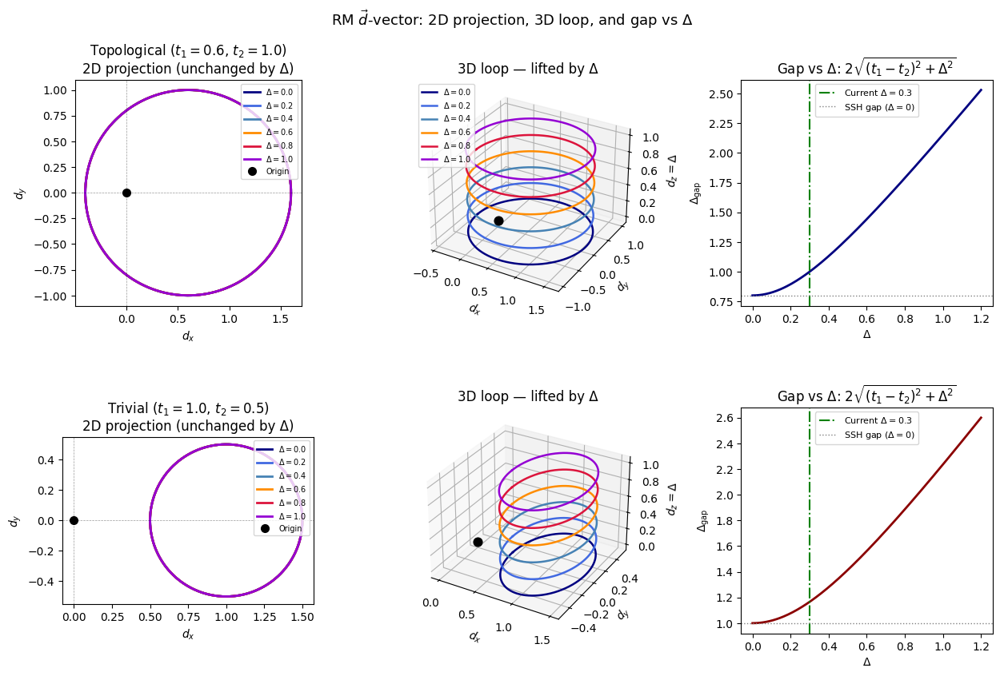

In [7]:
k_num = np.linspace(-np.pi, np.pi, 800)

# ── 2D projection + 3D d-vector for multiple Δ ────────────────────────────
Delta_vals = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
cols_dv    = ['navy','royalblue','steelblue','darkorange','crimson','darkviolet']

fig = plt.figure(figsize=(15, 9))
gs_dv = GridSpec(2, 3, figure=fig, hspace=0.45, wspace=0.35)

for row, (t1_p, t2_p, phase_lbl) in enumerate([
        (t1_topo, t2_topo, fr'Topological ($t_1={t1_topo}$, $t_2={t2_topo}$)'),
        (t1_triv, t2_triv, fr'Trivial ($t_1={t1_triv}$, $t_2={t2_triv}$)')]):

    # --- 2D projection ---
    ax2 = fig.add_subplot(gs_dv[row, 0])
    for Dv, col in zip(Delta_vals, cols_dv):
        dx_n =  t1_p + t2_p * np.cos(k_num)
        dy_n = -t2_p * np.sin(k_num)
        ax2.plot(dx_n, dy_n, color=col, lw=2, label=fr'$\Delta={Dv}$')
    ax2.plot(0, 0, 'ko', ms=7, zorder=6, label='Origin')
    ax2.axhline(0, color='k', lw=0.5, ls='--', alpha=0.4)   # <-- fixed
    ax2.axvline(0, color='k', lw=0.5, ls='--', alpha=0.4)   # <-- fixed
    ax2.set_xlabel(r'$d_x$'); ax2.set_ylabel(r'$d_y$')
    ax2.set_title(f'{phase_lbl}\n2D projection (unchanged by Δ)')
    ax2.set_aspect('equal')
    ax2.legend(fontsize=7, loc='upper right')

    # --- 3D loop ---
    ax3 = fig.add_subplot(gs_dv[row, 1], projection='3d')
    for Dv, col in zip(Delta_vals, cols_dv):
        dx_n =  t1_p + t2_p * np.cos(k_num)
        dy_n = -t2_p * np.sin(k_num)
        dz_n = np.full_like(k_num, Dv)
        ax3.plot(dx_n, dy_n, dz_n, color=col, lw=1.8, label=fr'$\Delta={Dv}$')
    ax3.scatter([0], [0], [0], c='black', s=60, zorder=5)
    ax3.set_xlabel(r'$d_x$'); ax3.set_ylabel(r'$d_y$'); ax3.set_zlabel(r'$d_z=\Delta$')
    ax3.set_title(f'3D loop — lifted by Δ')
    if row == 0: ax3.legend(fontsize=7, loc='upper left')

    # --- Gap vs Δ ---
    ax_gap = fig.add_subplot(gs_dv[row, 2])
    Dv_arr    = np.linspace(0, 1.2, 200)
    gap_arr   = 2*np.sqrt((t1_p - t2_p)**2 + Dv_arr**2)
    ax_gap.plot(Dv_arr, gap_arr, color='navy' if row==0 else 'darkred', lw=2)
    ax_gap.axvline(Delta, color='green', lw=1.5, ls='-.', label=fr'Current $\Delta={Delta}$')
    ax_gap.axhline(2*abs(t1_p-t2_p), color='gray', lw=1, ls=':', label=r'SSH gap ($\Delta=0$)')
    ax_gap.set_xlabel(r'$\Delta$'); ax_gap.set_ylabel(r'$\Delta_\mathrm{gap}$')
    ax_gap.set_title(fr'Gap vs $\Delta$: $2\sqrt{{(t_1-t_2)^2+\Delta^2}}$')
    ax_gap.legend(fontsize=8)

fig.suptitle(r'RM $\vec{d}$-vector: 2D projection, 3D loop, and gap vs $\Delta$', fontsize=13)
plt.savefig('RM_dvector.png', dpi=150, bbox_inches='tight')
plt.show()

Saved → RM_dvector_cycle.gif


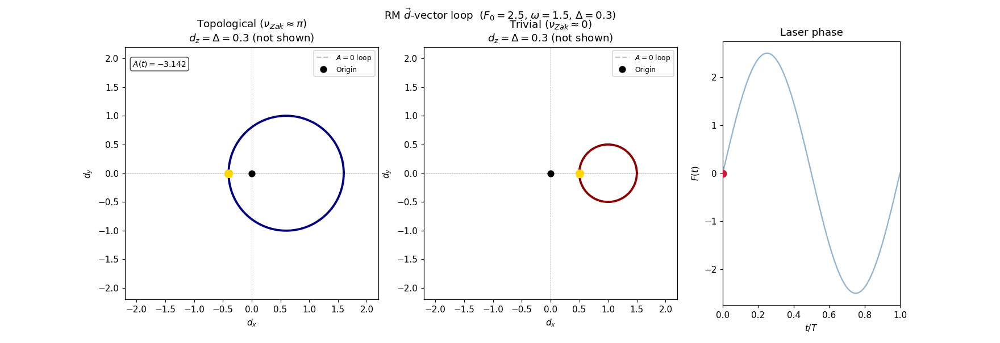

In [8]:
# ── d-vector animation over one laser cycle (2D projection) ───────────────
n_frames_d = 100
A_cyc_d    = np.linspace(-np.pi, np.pi, n_frames_d, endpoint=False)
t_cyc_d    = np.linspace(0, T_per, n_frames_d, endpoint=False)
t_prog_d   = np.linspace(0, T_per, 400)

fig_d, axes_d = plt.subplots(1, 3, figsize=(16, 5.5),
                               gridspec_kw=dict(width_ratios=[1, 1, 0.7]))
ax_t, ax_v, ax_pr = axes_d

for ax, (t1_p, t2_p, col, phase_lbl) in zip([ax_t, ax_v], [
        (t1_topo, t2_topo, 'navy',    fr'Topological ($\nu_{{Zak}}\approx\pi$)'),
        (t1_triv, t2_triv, 'darkred', fr'Trivial ($\nu_{{Zak}}\approx0$)')]):
    # Reference A=0 loop
    dx0 =  t1_p + t2_p * np.cos(k_num)
    dy0 = -t2_p * np.sin(k_num)
    ax.plot(dx0, dy0, 'gray', lw=1.5, ls='--', alpha=0.45, label='$A=0$ loop')
    ax.axhline(0, color='k', lw=0.5, ls='--', alpha=0.4)   # fixed
    ax.axvline(0, color='k', lw=0.5, ls='--', alpha=0.4)   # fixed
    ax.plot(0, 0, 'ko', ms=7, zorder=6, label='Origin')
    ax.set_xlabel(r'$d_x$'); ax.set_ylabel(r'$d_y$')
    ax.set_title(fr'{phase_lbl}' + '\n' + fr'$d_z=\Delta={Delta}$ (not shown)')
    ax.set_aspect('equal')
    lim = max(t1_p, t2_p) * 2.2
    ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)
    ax.legend(fontsize=8, loc='best')

ax_pr.plot(t_prog_d/T_per, F0*np.sin(omega*t_prog_d), color='steelblue', lw=1.5, alpha=0.6)
ax_pr.set_xlim(0,1); ax_pr.set_xlabel(r'$t/T$'); ax_pr.set_ylabel(r'$F(t)$')
ax_pr.set_title('Laser phase')

loop_t, = ax_t.plot([], [], color='navy',    lw=2.5)
loop_v, = ax_v.plot([], [], color='darkred', lw=2.5)
dot_t,  = ax_t.plot([], [], 'o', color='gold', ms=9, zorder=7)
dot_v,  = ax_v.plot([], [], 'o', color='gold', ms=9, zorder=7)
prog_d, = ax_pr.plot([], [], 'o', color='crimson', ms=8, zorder=5)
vl_d    = ax_pr.axvline(0, color='crimson', lw=1.2, ls='--', alpha=0.7)
txt_d   = ax_t.text(0.03, 0.95, '', transform=ax_t.transAxes, fontsize=9,
                     va='top', bbox=dict(boxstyle='round', fc='white', alpha=0.7))
fig_d.suptitle(fr'RM $\vec{{d}}$-vector loop  ($F_0={F0}$, $\omega={omega}$, $\Delta={Delta}$)', fontsize=12)

def update_d(frame):
    A_v = A_cyc_d[frame]; ph = frame / n_frames_d
    for t1_p, t2_p, loop_h, dot_h in [
            (t1_topo, t2_topo, loop_t, dot_t),
            (t1_triv, t2_triv, loop_v, dot_v)]:
        dx_n = t1_p + t2_p * np.cos(k_num + A_v)
        dy_n = -t2_p * np.sin(k_num + A_v)
        loop_h.set_data(dx_n, dy_n)
        dot_h.set_data([t1_p + t2_p*np.cos(A_v)], [-t2_p*np.sin(A_v)])
    prog_d.set_data([ph], [F0*np.sin(omega*t_cyc_d[frame])])
    vl_d.set_xdata([ph, ph])
    txt_d.set_text(fr'$A(t)={A_v:+.3f}$')
    return loop_t, loop_v, dot_t, dot_v, prog_d, vl_d, txt_d

anim_d = animation.FuncAnimation(fig_d, update_d, frames=n_frames_d, interval=60, blit=True)
anim_d.save('RM_dvector_cycle.gif', writer=PillowWriter(fps=18), dpi=110)
plt.close(fig_d)
print("Saved → RM_dvector_cycle.gif")
Image('RM_dvector_cycle.gif')

## 6. Eigenenergy Dispersion vs Staggered Potential

$$E_\pm(k, \Delta) = \pm\sqrt{t_1^2 + t_2^2 + 2t_1t_2\cos k + \Delta^2} \qquad (A=0)$$

Key observations:
- The **band shape** (dispersion curve) is unchanged by $\Delta$ — only the **overall scale** increases  
- The **gap at $k=\pi$** grows as $\sqrt{(t_1-t_2)^2 + \Delta^2}$ — a hyperbola in the $(t_1-t_2, \Delta)$ plane  
- Even without laser, $\Delta$ can be tuned to control the gap independently of topology

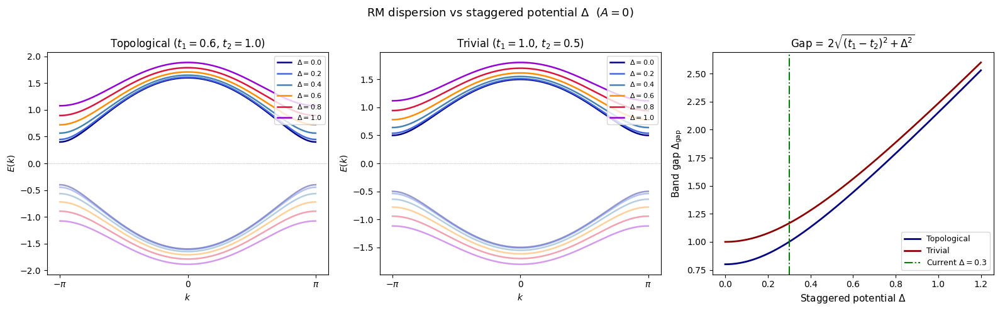

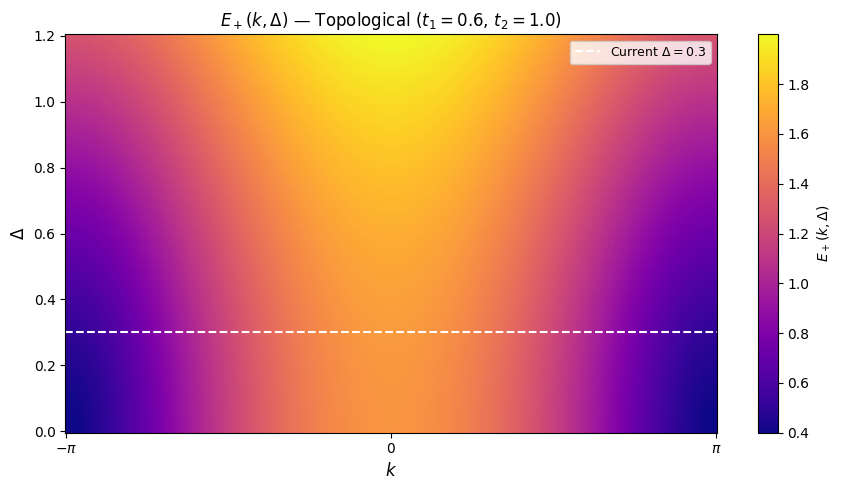

In [9]:
## 6. Eigenenergy Dispersion vs Staggered Potential

k_fine  = np.linspace(-np.pi, np.pi, 600)
Delta_scan_plot = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
cols_dp = ['navy','royalblue','steelblue','darkorange','crimson','darkviolet']
A_fixed = 0.0

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Left: band structure vs Δ — topological
for Dv, col in zip(Delta_scan_plot, cols_dp):
    Ep = dispersion_RM(t1_topo, t2_topo, A_fixed, Dv, k_fine)
    axes[0].plot(k_fine,  Ep, color=col, lw=1.8, label=fr'$\Delta={Dv}$')
    axes[0].plot(k_fine, -Ep, color=col, lw=1.8, alpha=0.4)
axes[0].axhline(0, color='gray', lw=0.5, ls=':')          # <-- fixed
axes[0].set_title(fr'Topological ($t_1={t1_topo}$, $t_2={t2_topo}$)')
axes[0].set_xlabel(r'$k$'); axes[0].set_ylabel(r'$E(k)$')
axes[0].set_xticks([-np.pi,0,np.pi]); axes[0].set_xticklabels([r'$-\pi$','$0$',r'$\pi$'])
axes[0].legend(fontsize=8, loc='upper right')

# Middle: band structure vs Δ — trivial
for Dv, col in zip(Delta_scan_plot, cols_dp):
    Ep = dispersion_RM(t1_triv, t2_triv, A_fixed, Dv, k_fine)
    axes[1].plot(k_fine,  Ep, color=col, lw=1.8, label=fr'$\Delta={Dv}$')
    axes[1].plot(k_fine, -Ep, color=col, lw=1.8, alpha=0.4)
axes[1].axhline(0, color='gray', lw=0.5, ls=':')          # <-- fixed
axes[1].set_title(fr'Trivial ($t_1={t1_triv}$, $t_2={t2_triv}$)')
axes[1].set_xlabel(r'$k$'); axes[1].set_ylabel(r'$E(k)$')
axes[1].set_xticks([-np.pi,0,np.pi]); axes[1].set_xticklabels([r'$-\pi$','$0$',r'$\pi$'])
axes[1].legend(fontsize=8, loc='upper right')

# Right: gap vs Δ hyperbola
Dv_arr = np.linspace(0, 1.2, 300)
for t1_p, t2_p, col, lbl in [
        (t1_topo, t2_topo, 'navy',    fr'Topological'),
        (t1_triv, t2_triv, 'darkred', fr'Trivial')]:
    gap_arr = 2*np.sqrt((t1_p-t2_p)**2 + Dv_arr**2)
    axes[2].plot(Dv_arr, gap_arr, color=col, lw=2, label=lbl)
axes[2].axvline(Delta, color='green', lw=1.5, ls='-.', label=fr'Current $\Delta={Delta}$')
axes[2].set_xlabel(r'Staggered potential $\Delta$', fontsize=11)
axes[2].set_ylabel(r'Band gap $\Delta_\mathrm{gap}$', fontsize=11)
axes[2].set_title(r'Gap = $2\sqrt{(t_1-t_2)^2+\Delta^2}$')
axes[2].legend(fontsize=9)

fig.suptitle('RM dispersion vs staggered potential $\\Delta$  ($A=0$)', fontsize=13)
plt.tight_layout()
plt.savefig('RM_dispersion_vs_Delta.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 2D colormap E_+(k, Δ) ─────────────────────────────────────────────────
Dv_map = np.linspace(0, 1.2, 120)
k_map  = np.linspace(-np.pi, np.pi, 300)
KK, DD = np.meshgrid(k_map, Dv_map)
Ep_map = np.sqrt(t1_topo**2+t2_topo**2+2*t1_topo*t2_topo*np.cos(KK)+DD**2)

fig, ax = plt.subplots(figsize=(9, 5))
im = ax.pcolormesh(k_map, Dv_map, Ep_map, cmap='plasma', shading='auto')
plt.colorbar(im, ax=ax, label=r'$E_+(k,\Delta)$')
ax.axhline(Delta, color='white', lw=1.5, ls='--', label=fr'Current $\Delta={Delta}$')
ax.set_xlabel(r'$k$', fontsize=12)
ax.set_ylabel(r'$\Delta$', fontsize=12)
ax.set_title(fr'$E_+(k,\Delta)$ — Topological ($t_1={t1_topo}$, $t_2={t2_topo}$)', fontsize=12)
ax.set_xticks([-np.pi,0,np.pi]); ax.set_xticklabels([r'$-\pi$','$0$',r'$\pi$'])
ax.legend(fontsize=9)
plt.tight_layout()
plt.savefig('RM_dispersion_map.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Floquet Analysis

The one-cycle Floquet propagator $U_F(k) = \mathcal{T}\exp(-i\int_0^T H_{RM}(k,A(t))dt)$ generates quasi-energies $\varepsilon(k)$.

With $\Delta\neq0$, gap closings in the Floquet spectrum signal **laser-induced rearrangements** of the Zak phase, which is continuously variable (not quantised to $0$ or $\pi$).

In [10]:
def floquet_propagator_batch_RM(t1, t2, F0_val, Delta_val, k_arr, n_steps=200):
    """One-cycle Floquet U_F(k) for RM via batched RK4. Returns (Nk,2,2)."""
    T_l  = 2*np.pi / omega
    dt_f = T_l / n_steps
    t_f  = np.linspace(0, T_l, n_steps, endpoint=False)
    A_f  = -(F0_val / omega) * np.cos(omega * t_f)
    Nk   = len(k_arr)
    U    = np.zeros((Nk, 2, 2), dtype=complex)
    U[:, 0, 0] = 1.0; U[:, 1, 1] = 1.0

    def f(u, H):
        return -1j * np.einsum('kij,kjl->kil', H, u)

    for step in range(n_steps):
        H_now  = bloch_H_RM_2x2(t1, t2, A_f[step], Delta_val, k_arr)
        H_next = bloch_H_RM_2x2(t1, t2, A_f[(step+1) % n_steps], Delta_val, k_arr)
        H_mid  = 0.5*(H_now + H_next)
        k1 = f(U, H_now);  k2 = f(U + 0.5*dt_f*k1, H_mid)
        k3 = f(U + 0.5*dt_f*k2, H_mid); k4 = f(U + dt_f*k3, H_next)
        U  = U + (dt_f/6.0)*(k1 + 2*k2 + 2*k3 + k4)
    return U


def floquet_spectrum_realspace_RM(t1, t2, F0_val, Delta_val=Delta, n_steps=200):
    """Full real-space Floquet quasi-energy spectrum (M eigenvalues)."""
    T_l  = 2*np.pi / omega
    dt_f = T_l / n_steps
    t_f  = np.linspace(0, T_l, n_steps, endpoint=False)
    A_f  = -(F0_val / omega) * np.cos(omega * t_f)
    U = np.eye(M, dtype=complex)
    for step in range(n_steps):
        U = expm(-1j * build_H_RM(t1, t2, A_f[step], Delta_val) * dt_f) @ U
    eig_U = np.linalg.eigvals(U)
    return np.sort((-np.angle(eig_U) / T_l).real)


def floquet_bands_RM_2x2(t1, t2, F0_val, Delta_val=Delta, k_arr=None, n_steps=120):
    """Floquet quasi-energy bands (Nk,2) from 2x2 propagator."""
    if k_arr is None: k_arr = np.linspace(-np.pi, np.pi, 200, endpoint=False)
    U   = floquet_propagator_batch_RM(t1, t2, F0_val, Delta_val, k_arr, n_steps)
    eig = np.linalg.eigvals(U)
    qe  = -np.angle(eig) / T_laser
    return np.sort(qe.real, axis=1)

Computing Floquet quasi-energy spectra (real-space) ...
  F0 = 0.000
  F0 = 0.510
  F0 = 1.020
  F0 = 1.531
  F0 = 2.041
Done.


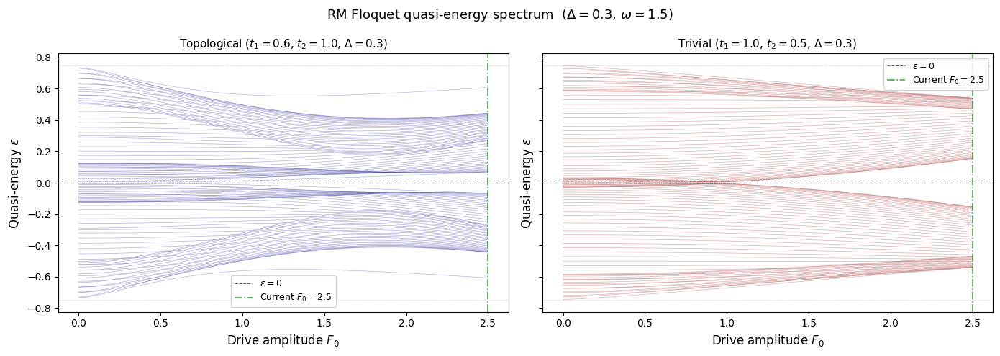

In [11]:
# ── Scan F0 for real-space Floquet spectrum ────────────────────────────────
F0_scan = np.linspace(0.0, 2.5, 50)
QE_topo = []
QE_triv = []

print("Computing Floquet quasi-energy spectra (real-space) ...")
for idx, F0_val in enumerate(F0_scan):
    QE_topo.append(floquet_spectrum_realspace_RM(t1_topo, t2_topo, F0_val))
    QE_triv.append(floquet_spectrum_realspace_RM(t1_triv, t2_triv, F0_val))
    if idx % 10 == 0: print(f"  F0 = {F0_val:.3f}")

QE_topo = np.array(QE_topo)
QE_triv = np.array(QE_triv)
print("Done.")

# ── Plot quasi-energy spectrum vs F0 ──────────────────────────────────────
qe_lim = np.pi / T_laser
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

for ax, QE, col, lbl in zip(axes,
        [QE_topo, QE_triv], ['navy','darkred'],
        [fr'Topological ($t_1={t1_topo}$, $t_2={t2_topo}$, $\Delta={Delta}$)',
         fr'Trivial ($t_1={t1_triv}$, $t_2={t2_triv}$, $\Delta={Delta}$)']):
    for m in range(M):
        ax.plot(F0_scan, QE[:, m], color=col, lw=0.5, alpha=0.3)
    ax.axhline(0,     color='black', lw=0.8, ls='--', alpha=0.6, label=r'$\varepsilon=0$')
    ax.axhline( qe_lim, color='gray', lw=0.6, ls=':', alpha=0.5)
    ax.axhline(-qe_lim, color='gray', lw=0.6, ls=':', alpha=0.5)
    ax.axvline(F0, color='green', lw=1.2, ls='-.', alpha=0.7, label=fr'Current $F_0={F0}$')
    ax.set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
    ax.set_ylabel(r'Quasi-energy $\varepsilon$', fontsize=12)
    ax.set_title(lbl, fontsize=11)
    ax.legend(fontsize=9)

plt.suptitle(fr'RM Floquet quasi-energy spectrum  ($\Delta={Delta}$, $\omega={omega}$)', fontsize=13)
plt.tight_layout()
plt.savefig('RM_floquet_spectrum.png', dpi=150, bbox_inches='tight')
plt.show()

Pre-computing instantaneous RM spectra ...
Done.
Saved → RM_eigenenergy_cycle.gif


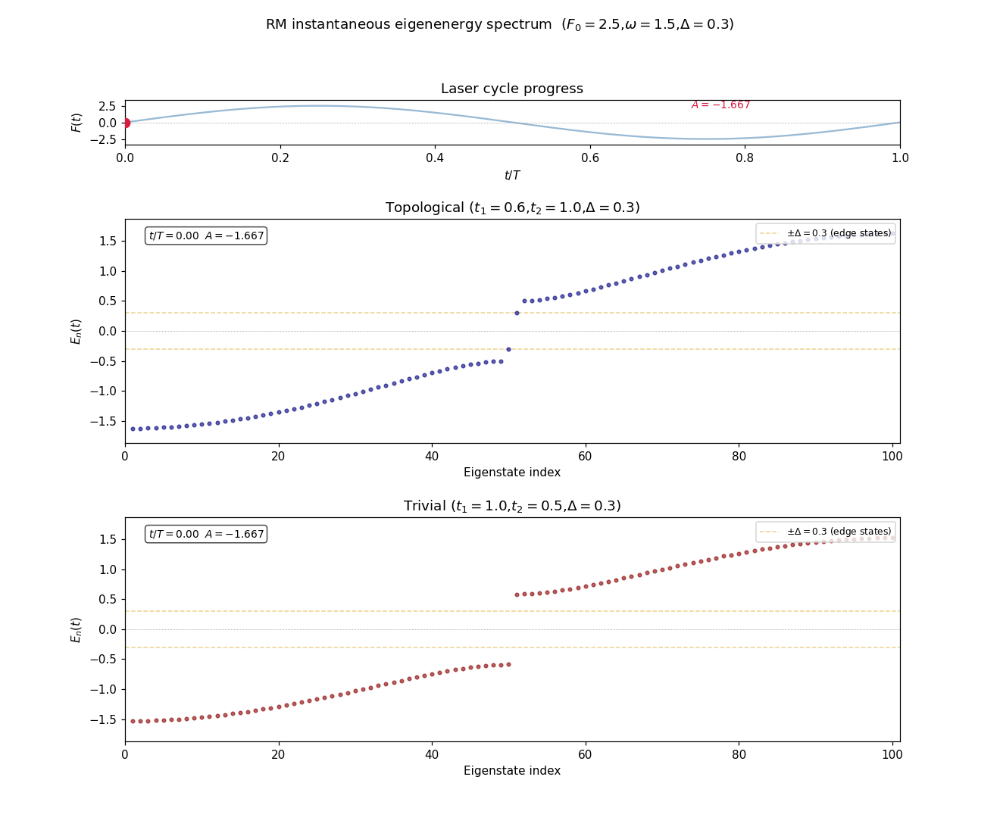

In [12]:
# ── Instantaneous eigenenergy animation over one laser cycle ───────────────
n_frames_fl = 120
t_cyc_fl    = np.linspace(0, T_per, n_frames_fl, endpoint=False)
A_cyc_fl    = -(F0/omega)*np.cos(omega*t_cyc_fl)

print("Pre-computing instantaneous RM spectra ...")
spec_fl_topo = np.array([np.linalg.eigvalsh(build_H_RM(t1_topo,t2_topo,Av)) for Av in A_cyc_fl])
spec_fl_triv = np.array([np.linalg.eigvalsh(build_H_RM(t1_triv,t2_triv,Av)) for Av in A_cyc_fl])
E_max_fl = max(np.max(np.abs(spec_fl_topo)), np.max(np.abs(spec_fl_triv))) * 1.15
idx_axis = np.arange(1, M+1)
print("Done.")

fig_fl, axes_fl = plt.subplots(3, 1, figsize=(12, 10),
                                 gridspec_kw=dict(height_ratios=[0.2,1,1], hspace=0.45))
ax_pr_fl, ax_t_fl, ax_v_fl = axes_fl

t_prog_fl = np.linspace(0, T_per, 400)
ax_pr_fl.plot(t_prog_fl/T_per, F0*np.sin(omega*t_prog_fl), color='steelblue', lw=1.5, alpha=0.55)
ax_pr_fl.axhline(0, color='gray', lw=0.5, ls=':')                    # fixed
ax_pr_fl.set_xlim(0,1); ax_pr_fl.set_ylim(-F0*1.35,F0*1.35)
ax_pr_fl.set_xlabel(r'$t/T$'); ax_pr_fl.set_ylabel(r'$F(t)$')
ax_pr_fl.set_title('Laser cycle progress')
prog_dot_fl, = ax_pr_fl.plot([],[],'o',color='crimson',ms=8,zorder=5)
vl_fl  = ax_pr_fl.axvline(0,color='crimson',lw=1.2,ls='--',alpha=0.7)
A_txt_fl = ax_pr_fl.text(0.73,0.82,'',transform=ax_pr_fl.transAxes,fontsize=9,color='crimson')

for ax, col, title in [
        (ax_t_fl,'navy',   fr'Topological ($t_1={t1_topo}$,$t_2={t2_topo}$,$\Delta={Delta}$)'),
        (ax_v_fl,'darkred',fr'Trivial ($t_1={t1_triv}$,$t_2={t2_triv}$,$\Delta={Delta}$)')]:
    ax.set_xlim(0,M+1); ax.set_ylim(-E_max_fl,E_max_fl)
    ax.axhline(0, color='gray', lw=0.5, ls=':')                     # fixed
    ax.axhline(+Delta, color='goldenrod', lw=1, ls='--', alpha=0.5, label=fr'$\pm\Delta={Delta}$ (edge states)')  # fixed
    ax.axhline(-Delta, color='goldenrod', lw=1, ls='--', alpha=0.5) # fixed
    ax.set_xlabel('Eigenstate index'); ax.set_ylabel(r'$E_n(t)$')
    ax.set_title(title); ax.legend(fontsize=8,loc='upper right')

scat_t,= ax_t_fl.plot([],[],'o',color='navy',ms=3,alpha=0.6)
scat_v,= ax_v_fl.plot([],[],'o',color='darkred',ms=3,alpha=0.6)
txt_t  = ax_t_fl.text(0.03,0.95,'',transform=ax_t_fl.transAxes,fontsize=9,va='top',
                       bbox=dict(boxstyle='round,pad=0.3',fc='white',alpha=0.7))
txt_v  = ax_v_fl.text(0.03,0.95,'',transform=ax_v_fl.transAxes,fontsize=9,va='top',
                       bbox=dict(boxstyle='round,pad=0.3',fc='white',alpha=0.7))
fig_fl.suptitle(fr'RM instantaneous eigenenergy spectrum  ($F_0={F0}$,$\omega={omega}$,$\Delta={Delta}$)',fontsize=12)

def update_fl(frame):
    ph = frame/n_frames_fl; A_v = A_cyc_fl[frame]
    scat_t.set_data(idx_axis, spec_fl_topo[frame])
    scat_v.set_data(idx_axis, spec_fl_triv[frame])
    prog_dot_fl.set_data([ph],[F0*np.sin(omega*t_cyc_fl[frame])])
    vl_fl.set_xdata([ph,ph]); stamp = fr'$t/T={ph:.2f}$  $A={A_v:+.3f}$'
    txt_t.set_text(stamp); txt_v.set_text(stamp); A_txt_fl.set_text(fr'$A={A_v:+.3f}$')
    return scat_t,scat_v,prog_dot_fl,vl_fl,txt_t,txt_v,A_txt_fl

anim_fl = animation.FuncAnimation(fig_fl, update_fl, frames=n_frames_fl, interval=60, blit=True)
anim_fl.save('RM_eigenenergy_cycle.gif', writer=PillowWriter(fps=18), dpi=110)
plt.close(fig_fl); print("Saved → RM_eigenenergy_cycle.gif")
Image('RM_eigenenergy_cycle.gif')

Saved → RM_dispersion_cycle.gif


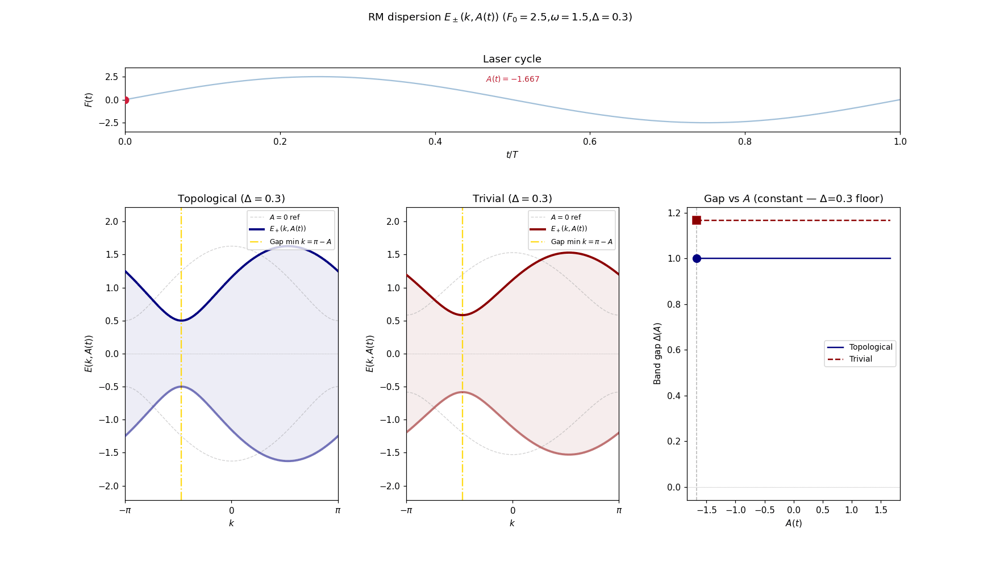

In [13]:
# ── Dispersion relation animation over one laser cycle ─────────────────────
k_plot  = np.linspace(-np.pi, np.pi, 600)
E0_topo = dispersion_RM(t1_topo, t2_topo, 0.0, Delta, k_plot)
E0_triv = dispersion_RM(t1_triv, t2_triv, 0.0, Delta, k_plot)
A_range = np.linspace(-F0/omega, F0/omega, 300)
gap_topo_A = np.array([2*dispersion_RM(t1_topo,t2_topo,Av,Delta,k_plot).min() for Av in A_range])
gap_triv_A = np.array([2*dispersion_RM(t1_triv,t2_triv,Av,Delta,k_plot).min() for Av in A_range])

n_frames_dr = 100
t_cyc_dr = np.linspace(0, T_per, n_frames_dr, endpoint=False)
A_cyc_dr = -(F0/omega)*np.cos(omega*t_cyc_dr)

fig_dr = plt.figure(figsize=(16, 9))
gs_dr  = GridSpec(2, 3, figure=fig_dr, height_ratios=[0.22,1], hspace=0.42, wspace=0.32)
ax_prog = fig_dr.add_subplot(gs_dr[0,:])
ax_tp   = fig_dr.add_subplot(gs_dr[1,0])
ax_tv   = fig_dr.add_subplot(gs_dr[1,1])
ax_gap  = fig_dr.add_subplot(gs_dr[1,2])

ax_prog.plot(np.linspace(0,T_per,400)/T_per, F0*np.sin(omega*np.linspace(0,T_per,400)),
             color='steelblue',lw=1.5,alpha=0.5)
ax_prog.set_xlim(0,1); ax_prog.set_ylim(-F0*1.4,F0*1.4)
ax_prog.set_xlabel(r'$t/T$'); ax_prog.set_ylabel(r'$F(t)$')
ax_prog.set_title('Laser cycle')
prog_dot_dr, = ax_prog.plot([],[],'o',color='crimson',ms=8,zorder=5)
prog_vl_dr   = ax_prog.axvline(0,color='crimson',lw=1.1,ls='--',alpha=0.6)
A_lbl_dr     = ax_prog.text(0.5,0.78,'',transform=ax_prog.transAxes,fontsize=9,color='crimson',ha='center')

E_max_dr = max(t1_topo+t2_topo, t1_triv+t2_triv)*1.2 + Delta
for ax, E0, t1_p, t2_p, col, title in [
        (ax_tp,E0_topo,t1_topo,t2_topo,'navy',fr'Topological ($\Delta={Delta}$)'),
        (ax_tv,E0_triv,t1_triv,t2_triv,'darkred',fr'Trivial ($\Delta={Delta}$)')]:
    ax.plot(k_plot, E0,'gray',lw=0.9,ls='--',alpha=0.35,label='$A=0$ ref',zorder=1)
    ax.plot(k_plot,-E0,'gray',lw=0.9,ls='--',alpha=0.35,zorder=1)
    ax.axhline(0, color='gray', lw=0.4, ls=':')                     # fixed
    ax.set_xlim(-np.pi,np.pi); ax.set_ylim(-E_max_dr,E_max_dr)
    ax.set_xticks([-np.pi,0,np.pi]); ax.set_xticklabels([r'$-\pi$','$0$',r'$\pi$'])
    ax.set_xlabel(r'$k$'); ax.set_ylabel(r'$E(k,A(t))$')
    ax.set_title(title); ax.legend(fontsize=8,loc='upper right')

ax_gap.plot(A_range,gap_topo_A,color='navy',lw=1.6,label='Topological')
ax_gap.plot(A_range,gap_triv_A,color='darkred',lw=1.6,ls='--',label='Trivial')
ax_gap.axhline(0, color='gray', lw=0.5, ls=':')                    # fixed
ax_gap.set_xlabel(r'$A(t)$'); ax_gap.set_ylabel(r'Band gap $\Delta(A)$')
ax_gap.set_title(fr'Gap vs $A$ (constant — Δ={Delta} floor)'); ax_gap.legend(fontsize=9)

line_tp,=ax_tp.plot([],[],color='navy',lw=2.5,zorder=3,label='$E_+(k,A(t))$')
line_tm,=ax_tp.plot([],[],color='navy',lw=2.5,zorder=3,alpha=0.5)
line_vp,=ax_tv.plot([],[],color='darkred',lw=2.5,zorder=3,label='$E_+(k,A(t))$')
line_vm,=ax_tv.plot([],[],color='darkred',lw=2.5,zorder=3,alpha=0.5)
gmin_t =ax_tp.axvline(0,color='gold',lw=1.5,ls='-.',alpha=0.9,label=r'Gap min $k=\pi-A$')
gmin_v =ax_tv.axvline(0,color='gold',lw=1.5,ls='-.',alpha=0.9,label=r'Gap min $k=\pi-A$')
gap_dot_t,=ax_gap.plot([],[],'o',color='navy',ms=9,zorder=5)
gap_dot_v,=ax_gap.plot([],[],'s',color='darkred',ms=9,zorder=5)
gap_vl_dr=ax_gap.axvline(0,color='dimgray',lw=1,ls='--',alpha=0.5)
for ax in (ax_tp,ax_tv): ax.legend(fontsize=8,loc='upper right')
fig_dr.suptitle(fr'RM dispersion $E_\pm(k,A(t))$ ($F_0={F0}$,$\omega={omega}$,$\Delta={Delta}$)',fontsize=12)
fill_t=ax_tp.fill_between(k_plot,np.zeros_like(k_plot),np.zeros_like(k_plot),alpha=0.08,color='navy')
fill_v=ax_tv.fill_between(k_plot,np.zeros_like(k_plot),np.zeros_like(k_plot),alpha=0.08,color='darkred')

def update_dr(frame):
    global fill_t,fill_v
    A_v=A_cyc_dr[frame]; ph=frame/n_frames_dr
    Ep_t=dispersion_RM(t1_topo,t2_topo,A_v,Delta,k_plot)
    Ep_v=dispersion_RM(t1_triv,t2_triv,A_v,Delta,k_plot)
    line_tp.set_data(k_plot,Ep_t); line_tm.set_data(k_plot,-Ep_t)
    line_vp.set_data(k_plot,Ep_v); line_vm.set_data(k_plot,-Ep_v)
    fill_t.remove(); fill_v.remove()
    fill_t=ax_tp.fill_between(k_plot,-Ep_t,Ep_t,alpha=0.07,color='navy',zorder=0)
    fill_v=ax_tv.fill_between(k_plot,-Ep_v,Ep_v,alpha=0.07,color='darkred',zorder=0)
    km=((np.pi-A_v)+np.pi)%(2*np.pi)-np.pi
    gmin_t.set_xdata([km,km]); gmin_v.set_xdata([km,km])
    gap_dot_t.set_data([A_v],[2*Ep_t.min()]); gap_dot_v.set_data([A_v],[2*Ep_v.min()])
    gap_vl_dr.set_xdata([A_v,A_v])
    prog_dot_dr.set_data([ph],[F0*np.sin(omega*t_cyc_dr[frame])])
    prog_vl_dr.set_xdata([ph,ph]); A_lbl_dr.set_text(fr'$A(t)={A_v:+.3f}$')
    return (line_tp,line_tm,line_vp,line_vm,fill_t,fill_v,
            gmin_t,gmin_v,gap_dot_t,gap_dot_v,gap_vl_dr,prog_dot_dr,prog_vl_dr,A_lbl_dr)

anim_dr=animation.FuncAnimation(fig_dr,update_dr,frames=n_frames_dr,interval=60,blit=True)
anim_dr.save('RM_dispersion_cycle.gif',writer=PillowWriter(fps=18),dpi=110)
plt.close(fig_dr); print("Saved → RM_dispersion_cycle.gif")
Image('RM_dispersion_cycle.gif')

## 8. Floquet Gap vs Drive Amplitude

The **static gap** $2\sqrt{(t_1-t_2)^2+\Delta^2}$ is A-independent.  
The **Floquet quasi-energy gap** can close because $U_F(k)$ accumulates phase over a full cycle, even when the instantaneous gap never closes.

Gap closings at $\varepsilon=0$ or $\varepsilon=\pm\pi/T$ correspond to jumps in the **Floquet Zak phase** $\gamma_F$.

/tmp/ipykernel_58/1399764961.py:7: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "s-" (-> linestyle='-'). The keyword argument will take precedence.
  axes[0].plot(F0_scan, min_gap_triv, 's-', color='darkred', lw=2, ms=5, ls='--', label='Trivial')


Approx. Floquet gap-closing F0 (topo) ≈ [0.561]
Approx. Floquet gap-closing F0 (triv) ≈ [0.459 0.663]


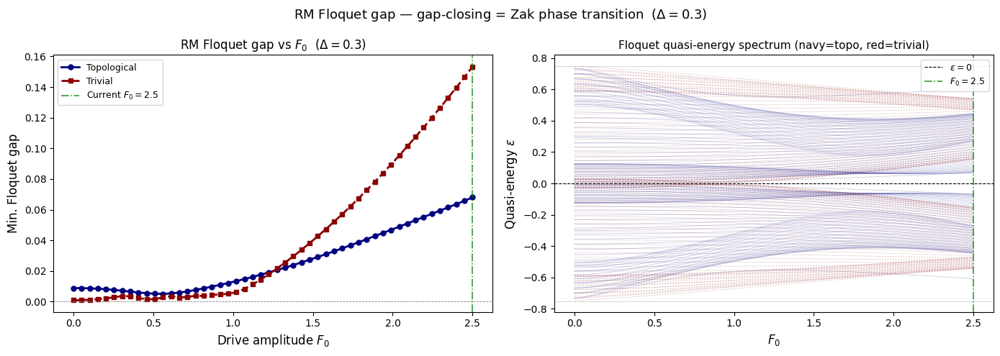

In [14]:
min_gap_topo = [np.min(np.abs(qe)) for qe in QE_topo]
min_gap_triv = [np.min(np.abs(qe)) for qe in QE_triv]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(F0_scan, min_gap_topo, 'o-', color='navy',    lw=2, ms=5, label='Topological')
axes[0].plot(F0_scan, min_gap_triv, 's-', color='darkred', lw=2, ms=5, ls='--', label='Trivial')
axes[0].axhline(0, color='gray', lw=0.6, ls='--')
axes[0].axvline(F0, color='green', lw=1.2, ls='-.', alpha=0.8, label=fr'Current $F_0={F0}$')
axes[0].set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
axes[0].set_ylabel(r'Min. Floquet gap', fontsize=12)
axes[0].set_title(fr'RM Floquet gap vs $F_0$  ($\Delta={Delta}$)', fontsize=12)
axes[0].legend(fontsize=9)

for m in range(M):
    axes[1].plot(F0_scan, QE_topo[:, m], color='navy',    lw=0.5, alpha=0.25)
    axes[1].plot(F0_scan, QE_triv[:, m], color='darkred', lw=0.5, alpha=0.25, ls='--')
axes[1].axhline(0,      color='black', lw=0.8, ls='--', label=r'$\varepsilon=0$')
axes[1].axhline( np.pi/T_laser, color='gray', lw=0.6, ls=':')
axes[1].axhline(-np.pi/T_laser, color='gray', lw=0.6, ls=':')
axes[1].axvline(F0, color='green', lw=1.2, ls='-.', alpha=0.8, label=fr'$F_0={F0}$')
axes[1].set_xlabel(r'$F_0$', fontsize=12)
axes[1].set_ylabel(r'Quasi-energy $\varepsilon$', fontsize=12)
axes[1].set_title('Floquet quasi-energy spectrum (navy=topo, red=trivial)', fontsize=11)
axes[1].legend(fontsize=9)

# Identify gap-closing F0 values (local minima of min_gap)
from scipy.signal import argrelmin
idx_close_t = argrelmin(np.array(min_gap_topo), order=2)[0]
idx_close_v = argrelmin(np.array(min_gap_triv), order=2)[0]
trans_topo  = F0_scan[idx_close_t[np.array(min_gap_topo)[idx_close_t] < 0.05]] if len(idx_close_t)>0 else np.array([])
trans_triv  = F0_scan[idx_close_v[np.array(min_gap_triv)[idx_close_v] < 0.05]] if len(idx_close_v)>0 else np.array([])
print(f"Approx. Floquet gap-closing F0 (topo) ≈ {np.round(trans_topo,3)}")
print(f"Approx. Floquet gap-closing F0 (triv) ≈ {np.round(trans_triv,3)}")

plt.suptitle(fr'RM Floquet gap — gap-closing = Zak phase transition  ($\Delta={Delta}$)', fontsize=13)
plt.tight_layout()
plt.savefig('RM_floquet_gap.png', dpi=150, bbox_inches='tight')
plt.show()

## 9. Topological Invariant: Zak Phase

The **Zak phase** (Berry phase across BZ) for the lower band:

$$\gamma = i\int_{-\pi}^{\pi}\langle u_{-,k}|\partial_k|u_{-,k}\rangle\,dk
         = -\operatorname{Im}\log\prod_{n=0}^{N_k-1}\langle u_{-,k_n}|u_{-,k_{n+1}}\rangle$$

- At $\Delta=0$: $\gamma=\pi$ (topological) or $0$ (trivial) — SSH winding
- At $\Delta\neq0$: $\gamma$ varies **continuously** between $0$ and $\pi$ — not quantised
- The phase boundary in the $(\frac{t_1}{t_2},\Delta)$ plane passes through $t_1=t_2,\;\Delta=0$

SSH Δ=0 topo (t1/t2=0.6): γ = 3.1416 = 1.0000π
SSH Δ=0 triv (t1/t2=2.0): γ = 0.0000 = 0.0000π


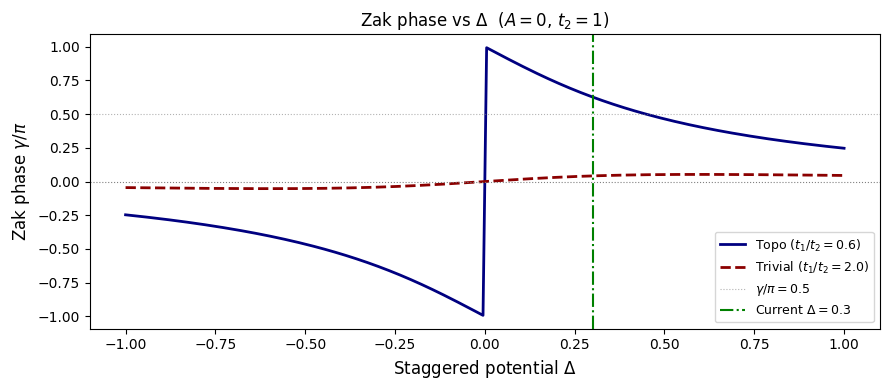

In [15]:
def zak_phase(t1_ratio, t2, A_val, Delta_val, Nk=1000):
    """
    Zak phase (Berry phase) of the lower RM band.
    Arguments: (t1/t2 ratio, t2, vector potential A, staggered potential Δ)
    Returns:   (gamma in radians, gamma/pi)
    """
    t1    = t1_ratio * t2
    k_arr = np.linspace(-np.pi, np.pi, Nk, endpoint=False)

    evecs_lower = np.zeros((Nk, 2), dtype=complex)
    for i, kv in enumerate(k_arr):
        h = t1 + t2 * np.exp(-1j * (kv + A_val))
        H = np.array([[Delta_val, h], [np.conj(h), -Delta_val]])
        _, vecs = np.linalg.eigh(H)           # vecs[:,0] = lower eigenstate
        evecs_lower[i] = vecs[:, 0]

    # Wilson loop (link variables — gauge invariant)
    prod = 1.0 + 0j
    for i in range(Nk - 1):
        prod *= np.vdot(evecs_lower[i], evecs_lower[i+1])
    prod *= np.vdot(evecs_lower[-1], evecs_lower[0])   # close BZ loop

    gamma = -np.imag(np.log(prod))
    return gamma, gamma / np.pi


# ── Verify SSH limits ──────────────────────────────────────────────────────
for t1r, lbl in [(0.6, 'topo (t1/t2=0.6)'), (2.0, 'triv (t1/t2=2.0)')]:
    g, g_pi = zak_phase(t1r, 1.0, 0.0, 0.0)
    print(f"SSH Δ=0 {lbl}: γ = {g:.4f} = {g_pi:.4f}π")

# ── Zak phase vs Δ (1D) ────────────────────────────────────────────────────
Delta_1d = np.linspace(-1.0, 1.0, 200)
gamma_topo_1d = np.array([zak_phase(t1_topo/t2_topo, t2_topo, 0.0, Dv)[0] for Dv in Delta_1d])
gamma_triv_1d = np.array([zak_phase(t1_triv/t2_triv, t2_triv, 0.0, Dv)[0] for Dv in Delta_1d])

fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(Delta_1d, gamma_topo_1d/np.pi, color='navy',    lw=2, label=fr'Topo ($t_1/t_2={t1_topo/t2_topo:.1f}$)')
ax.plot(Delta_1d, gamma_triv_1d/np.pi, color='darkred', lw=2, ls='--', label=fr'Trivial ($t_1/t_2={t1_triv/t2_triv:.1f}$)')
ax.axhline(0,   color='gray', lw=0.8, ls=':')
ax.axhline(0.5, color='gray', lw=0.8, ls=':', alpha=0.6, label=r'$\gamma/\pi=0.5$')
ax.axvline(Delta, color='green', lw=1.5, ls='-.', label=fr'Current $\Delta={Delta}$')
ax.set_xlabel(r'Staggered potential $\Delta$', fontsize=12)
ax.set_ylabel(r'Zak phase $\gamma/\pi$', fontsize=12)
ax.set_title(r'Zak phase vs $\Delta$  ($A=0$, $t_2=1$)', fontsize=12)
ax.legend(fontsize=9)
plt.tight_layout()
plt.savefig('RM_zak_vs_Delta.png', dpi=150, bbox_inches='tight')
plt.show()

Computing Zak phase diagram ...
Done.


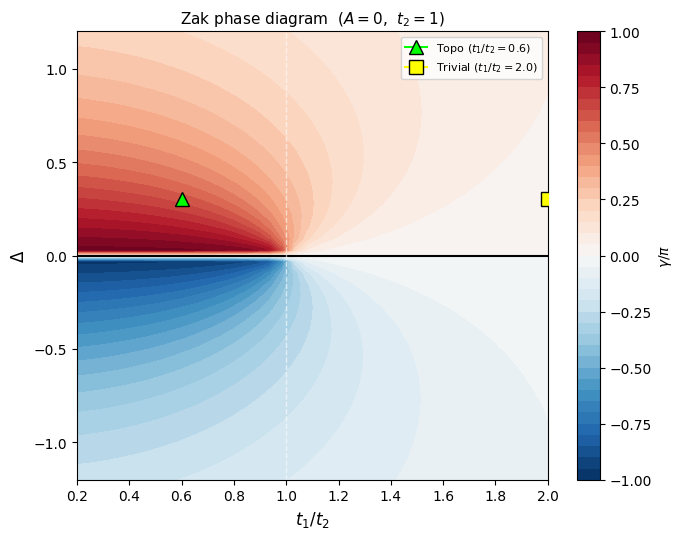

In [16]:
# ── Zak phase diagram in the (t1/t2, Δ) plane ─────────────────────────────
t1t2_scan   = np.linspace(0.2, 2.0, 40)
Delta_scan2 = np.linspace(-1.2, 1.2, 40)
TT, DD = np.meshgrid(t1t2_scan, Delta_scan2)
ZAK_MAP = np.zeros_like(TT)
print("Computing Zak phase diagram ...")
for i, Dv in enumerate(Delta_scan2):
    for j, r in enumerate(t1t2_scan):
        g, _ = zak_phase(r, 1.0, 0.0, Dv)
        ZAK_MAP[i, j] = g
print("Done.")

fig, ax = plt.subplots(figsize=(7, 5.5))
im = ax.contourf(
    TT, DD, ZAK_MAP/np.pi,
    levels=np.linspace(-1, 1, 41),
    cmap='RdBu_r'
)
ax.contour(
    TT, DD, ZAK_MAP/np.pi,
    levels=[0.0],
    colors='black',
    linewidths=1.5
)
ax.axvline(
    1.0,
    color='white',
    lw=1.0,
    ls='--',
    alpha=0.6
)
ax.plot(
    t1_topo/t2_topo, Delta,
    marker='^',
    color='lime',
    markeredgecolor='black',
    ms=10,
    zorder=5,
    label=fr'Topo ($t_1/t_2={t1_topo/t2_topo:.1f}$)'
)
ax.plot(
    t1_triv/t2_triv, Delta,
    marker='s',
    color='yellow',
    markeredgecolor='black',
    ms=10,
    zorder=5,
    label=fr'Trivial ($t_1/t_2={t1_triv/t2_triv:.1f}$)'
)
cbar = plt.colorbar(im, ax=ax)
cbar.set_label(r'$\gamma/\pi$')
ax.set_xlabel(r'$t_1/t_2$', fontsize=12)
ax.set_ylabel(r'$\Delta$', fontsize=12)
ax.set_ylim(-1.2, 1.2)
ax.set_title(
    r'Zak phase diagram  ($A=0$,  $t_2=1$)',
    fontsize=11
)
ax.legend(fontsize=8)
plt.tight_layout()
plt.savefig('RM_zak_phase_diagram.png', dpi=150, bbox_inches='tight')
plt.show()

## 10. Floquet Zak Phase

The **Floquet Zak phase** $\gamma_F$ is the Berry phase of the lower **Floquet** eigenstate across the BZ:

$$\gamma_F = -\operatorname{Im}\log\prod_{n=0}^{N_k-1}\langle u_{F,-}(k_n)|u_{F,-}(k_{n+1})\rangle$$

where $|u_{F,-}(k)\rangle$ is the lower quasi-energy eigenstate of $U_F(k)$.

Under the laser drive, $\gamma_F$ can jump at gap-closing points in the Floquet spectrum — this is the **laser-induced topological transition** in the RM model. Contours at $\gamma_F = \pm\pi/2$ mark the phase crossover lines.

Computing Floquet Zak phase vs F0 ...
     F0    γF_topo/π     PF_topo    γF_triv/π     PF_triv
  0.000       0.6269      0.3134       0.0418      0.0209
  0.086      -0.3312     -0.1656      -0.3236     -0.1618
  0.172      -0.2973     -0.1487      -0.2113     -0.1056
  0.259      -0.2970     -0.1485      -0.1883     -0.0941
  0.345      -0.3030     -0.1515      -0.1901     -0.0950
  0.431      -0.3127     -0.1563      -0.1938     -0.0969
  0.517      -0.3253     -0.1627      -0.2001     -0.1001
  0.603      -0.3407     -0.1703      -0.2094     -0.1047
  0.690      -0.3587     -0.1793      -0.2226     -0.1113
  0.776      -0.3794     -0.1897      -0.2413     -0.1207
  0.862      -0.4031     -0.2015      -0.2684     -0.1342
  0.948      -0.4299     -0.2150      -0.3059     -0.1530
  1.034      -0.4602     -0.2301      -0.3307     -0.1653
  1.121      -0.4945     -0.2473      -0.3317     -0.1659
  1.207      -0.5333     -0.2667      -0.3272     -0.1636
  1.293      -0.5772     -0.2886  

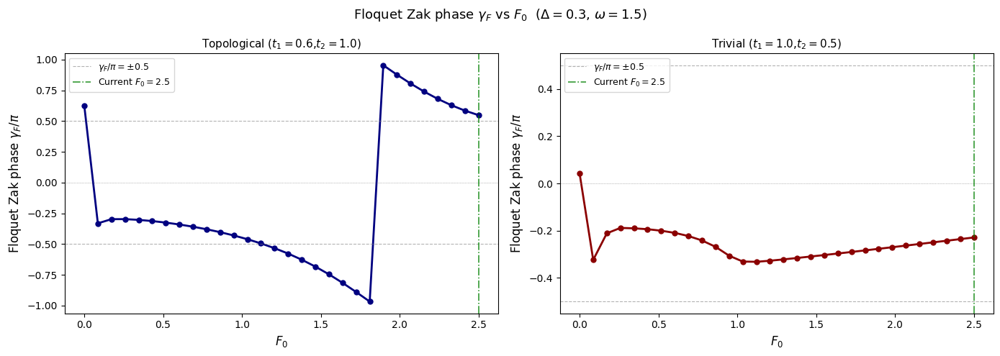

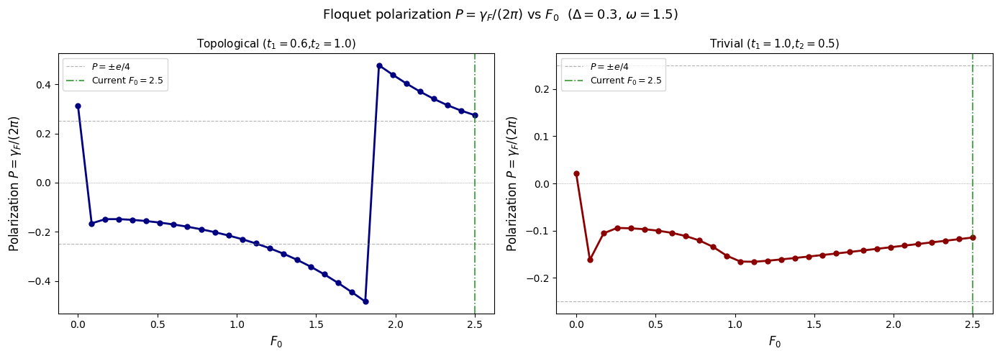

In [17]:
def floquet_zak_phase_RM(t1, t2, F0_val, Delta_val, Nk=200, n_steps=100):
    """
    Floquet Zak phase from the lower quasi-energy eigenstate of U_F(k).
    Uses link-variable Wilson loop.
    """
    if np.isclose(F0_val, 0.0, atol=1e-6):
        return zak_phase(t1/t2, t2, 0.0, Delta_val, Nk=Nk)[0]

    k_arr = np.linspace(-np.pi, np.pi, Nk, endpoint=False)
    U     = floquet_propagator_batch_RM(t1, t2, F0_val, Delta_val, k_arr, n_steps)

    evecs_lower = np.zeros((Nk, 2), dtype=complex)
    for i in range(Nk):
        evals, vecs = np.linalg.eig(U[i])
        qe = np.real(-np.angle(evals) / T_laser)
        evecs_lower[i] = vecs[:, np.argmin(qe)]

    # Wilson loop
    prod = 1.0 + 0j
    for i in range(Nk - 1):
        prod *= np.vdot(evecs_lower[i], evecs_lower[i+1])
    prod *= np.vdot(evecs_lower[-1], evecs_lower[0])
    return -np.imag(np.log(prod))


# ── 1D Floquet Zak phase vs F0 (quick scan) ───────────────────────────────
F0_zak_scan = np.linspace(0.0, 2.5, 30)
gamma_F_topo_1d = []
gamma_F_triv_1d = []

print("Computing Floquet Zak phase vs F0 ...")
print(f"{'F0':>7}  {'γF_topo/π':>11}  {'PF_topo':>10}  {'γF_triv/π':>11}  {'PF_triv':>10}")
for F0_v in F0_zak_scan:
    gt = floquet_zak_phase_RM(t1_topo, t2_topo, F0_v, Delta)
    gv = floquet_zak_phase_RM(t1_triv, t2_triv, F0_v, Delta)
    gamma_F_topo_1d.append(gt)
    gamma_F_triv_1d.append(gv)
    print(f"{F0_v:7.3f}  {gt/np.pi:11.4f}  {gt/(2*np.pi):10.4f}  {gv/np.pi:11.4f}  {gv/(2*np.pi):10.4f}")
print("Done.")

gamma_F_topo_1d = np.array(gamma_F_topo_1d)
gamma_F_triv_1d = np.array(gamma_F_triv_1d)

# ── Plot γF/π vs F0 ──────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for ax, gF, col, lbl in [
        (axes[0], gamma_F_topo_1d, 'navy',    fr'Topological ($t_1={t1_topo}$,$t_2={t2_topo}$)'),
        (axes[1], gamma_F_triv_1d, 'darkred', fr'Trivial ($t_1={t1_triv}$,$t_2={t2_triv}$)')]:
    ax.plot(F0_zak_scan, gF/np.pi, 'o-', color=col, lw=2, ms=5)
    ax.axhline(0.5,  color='gray', lw=0.8, ls='--', alpha=0.6, label=r'$\gamma_F/\pi=\pm0.5$')
    ax.axhline(-0.5, color='gray', lw=0.8, ls='--', alpha=0.6)
    ax.axhline(0,    color='gray', lw=0.5, ls=':')
    ax.axvline(F0, color='green', lw=1.2, ls='-.', alpha=0.8, label=fr'Current $F_0={F0}$')
    ax.set_xlabel(r'$F_0$', fontsize=12)
    ax.set_ylabel(r'Floquet Zak phase $\gamma_F/\pi$', fontsize=12)
    ax.set_title(lbl, fontsize=11)
    ax.legend(fontsize=9)

plt.suptitle(fr'Floquet Zak phase $\gamma_F$ vs $F_0$  ($\Delta={Delta}$, $\omega={omega}$)', fontsize=13)
plt.tight_layout()
plt.savefig('RM_floquet_zak_1d.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Polarization P = γF/(2π) vs F0 ──────────────────────────────────────
P_topo_1d = gamma_F_topo_1d / (2*np.pi)
P_triv_1d = gamma_F_triv_1d / (2*np.pi)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for ax, P, col, lbl in [
        (axes[0], P_topo_1d, 'navy',    fr'Topological ($t_1={t1_topo}$,$t_2={t2_topo}$)'),
        (axes[1], P_triv_1d, 'darkred', fr'Trivial ($t_1={t1_triv}$,$t_2={t2_triv}$)')]:
    ax.plot(F0_zak_scan, P, 'o-', color=col, lw=2, ms=5)
    ax.axhline(0.25, color='gray', lw=0.8, ls='--', alpha=0.6, label=r'$P = \pm e/4$')
    ax.axhline(-0.25, color='gray', lw=0.8, ls='--', alpha=0.6)
    ax.axhline(0, color='gray', lw=0.5, ls=':')
    ax.axvline(F0, color='green', lw=1.2, ls='-.', alpha=0.8, label=fr'Current $F_0={F0}$')
    ax.set_xlabel(r'$F_0$', fontsize=12)
    ax.set_ylabel(r'Polarization $P = \gamma_F/(2\pi)$', fontsize=12)
    ax.set_title(lbl, fontsize=11)
    ax.legend(fontsize=9)

plt.suptitle(fr'Floquet polarization $P = \gamma_F/(2\pi)$ vs $F_0$  ($\Delta={Delta}$, $\omega={omega}$)', fontsize=13)
plt.tight_layout()
plt.savefig('RM_floquet_polarization_1d.png', dpi=150, bbox_inches='tight')
plt.show()


Computing 2D Floquet Zak phase map ...
  F0 = 0.20 done
  F0 = 0.60 done
  F0 = 0.99 done
  F0 = 1.39 done
  F0 = 1.79 done
  F0 = 2.18 done
Done.


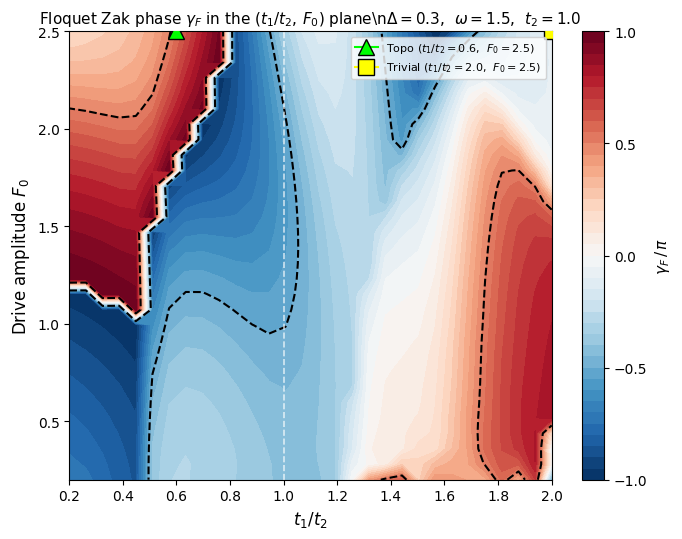

In [18]:
# ── 2D Floquet Zak phase diagram in (t1/t2, F0) plane ──────────────────────
print("\nComputing 2D Floquet Zak phase map ...")
t1t2_scan_fl = np.linspace(0.2, 2.0, 30)
F0_scan_fl   = np.linspace(0.2, 2.5, 30)
T1T2_RM, FF_RM = np.meshgrid(t1t2_scan_fl, F0_scan_fl)
GAMMA_MAP = np.zeros_like(T1T2_RM)

for iF, F0v in enumerate(F0_scan_fl):
    for ir, r in enumerate(t1t2_scan_fl):
        GAMMA_MAP[iF, ir] = floquet_zak_phase_RM(r, 1.0, F0v, Delta, Nk=150, n_steps=100)
    if iF % 5 == 0: print(f"  F0 = {F0v:.2f} done")
print("Done.")

# ── γF / π colourmap ──────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 5.5))
im = ax.contourf(
    T1T2_RM, FF_RM, GAMMA_MAP / np.pi,
    levels=np.linspace(-1, 1, 41),
    cmap='RdBu_r'
)
# γF = π/2 and γF = -π/2 contours mark the topological crossover
ax.contour(
    T1T2_RM, FF_RM, GAMMA_MAP / np.pi,
    levels=[-0.5, 0.5],        # must be increasing
    colors='black',
    linewidths=1.5,
    linestyles='--'
)
# Static SSH boundary (t1/t2 = 1, Δ = 0 limit)
ax.axvline(1.0, color='white', lw=1.2, ls='--', alpha=0.7)

# Physical points used throughout the notebook
ax.plot(
    t1_topo / t2_topo, F0,
    marker='^', color='lime', markeredgecolor='black',
    ms=11, zorder=5,
    label=fr'Topo ($t_1/t_2={t1_topo/t2_topo:.1f}$,  $F_0={F0}$)'
)
ax.plot(
    t1_triv / t2_triv, F0,
    marker='s', color='yellow', markeredgecolor='black',
    ms=11, zorder=5,
    label=fr'Trivial ($t_1/t_2={t1_triv/t2_triv:.1f}$,  $F_0={F0}$)'
)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label(r'$\gamma_F\,/\,\pi$', fontsize=11)
cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

ax.set_xlabel(r'$t_1 / t_2$', fontsize=12)
ax.set_ylabel(r'Drive amplitude $F_0$', fontsize=12)
ax.set_xlim(t1t2_scan_fl[0], t1t2_scan_fl[-1])
ax.set_ylim(F0_scan_fl[0],   F0_scan_fl[-1])
ax.set_title(
    fr'Floquet Zak phase $\gamma_F$ in the $(t_1/t_2,\,F_0)$ plane'
    fr'\n$\Delta={Delta}$,  $\omega={omega}$,  $t_2={t2_fixed}$',
    fontsize=11
)
ax.legend(fontsize=8, loc='upper right')
plt.tight_layout()
plt.savefig('RM_floquet_zak_phasediagram.png', dpi=150, bbox_inches='tight')
plt.show()

Generating GIF of RM quasi‑energy spectrum vs index ...
Saved → RM_floquet_spectrum_vs_index.gif


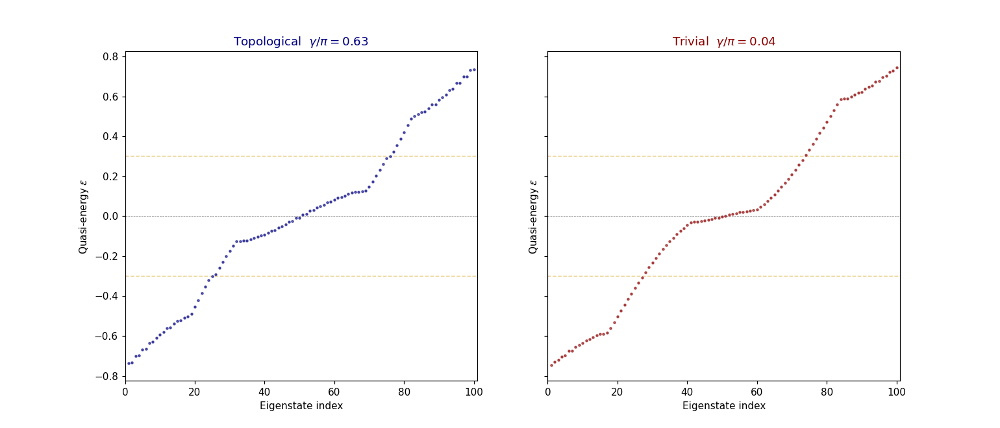

In [19]:
# ── GIF: real-space Floquet quasi-energy spectrum vs index ────────────────
print("Generating GIF of RM quasi‑energy spectrum vs index ...")
n_frames_es = len(F0_scan)
fig_es, axes_es = plt.subplots(1, 2, figsize=(14, 6), sharey=True)
ax_t_es, ax_v_es = axes_es

qe_lim_es = np.pi / T_laser * 1.1
for ax, col, lbl in zip([ax_t_es, ax_v_es], ['navy', 'darkred'],
                        ['Topological', 'Trivial']):
    ax.set_xlim(0, M+1)
    ax.set_ylim(-qe_lim_es, qe_lim_es)
    ax.axhline(0, color='gray', lw=0.5, ls='--')
    ax.axhline( qe_lim_es, color='gray', lw=0.5, ls=':')
    ax.axhline(-qe_lim_es, color='gray', lw=0.5, ls=':')
    ax.axhline(+Delta, color='goldenrod', lw=1, ls='--', alpha=0.5)
    ax.axhline(-Delta, color='goldenrod', lw=1, ls='--', alpha=0.5)
    ax.set_xlabel('Eigenstate index')
    ax.set_ylabel(r'Quasi‑energy $\varepsilon$')

line_t, = ax_t_es.plot([], [], 'o', color='navy',    ms=2, alpha=0.6)
line_v, = ax_v_es.plot([], [], 'o', color='darkred', ms=2, alpha=0.6)
txt_F_es = fig_es.text(0.5, 0.02, '', ha='center', fontsize=12, color='black')

def update_es(frame):
    idx = frame % n_frames_es
    F0_val = F0_scan[idx]
    spec_t = QE_topo[idx]
    spec_v = QE_triv[idx]
    x_axis = np.arange(1, M+1)
    line_t.set_data(x_axis, spec_t)
    line_v.set_data(x_axis, spec_v)
    # Get static Zak phase at current Δ (for reference)
    g_t, _ = zak_phase(t1_topo/t2_topo, t2_topo, 0.0, Delta)
    g_v, _ = zak_phase(t1_triv/t2_triv, t2_triv, 0.0, Delta)
    ax_t_es.set_title(f'Topological  $\\gamma/\\pi={g_t/np.pi:.2f}$', color='navy')
    ax_v_es.set_title(f'Trivial  $\\gamma/\\pi={g_v/np.pi:.2f}$', color='darkred')
    txt_F_es.set_text(fr'$F_0 = {F0_val:.3f}$')
    return line_t, line_v, txt_F_es

anim_es = animation.FuncAnimation(fig_es, update_es, frames=n_frames_es,
                                  interval=100, blit=True)
anim_es.save('RM_floquet_spectrum_vs_index.gif', writer=PillowWriter(fps=8), dpi=110)
plt.close(fig_es)
print("Saved → RM_floquet_spectrum_vs_index.gif")
Image('RM_floquet_spectrum_vs_index.gif')

Pre-computing RM Floquet band snapshots ...
Computing Floquet Zak phase ...
Done.
Saved → RM_floquet_gap_tracking.gif


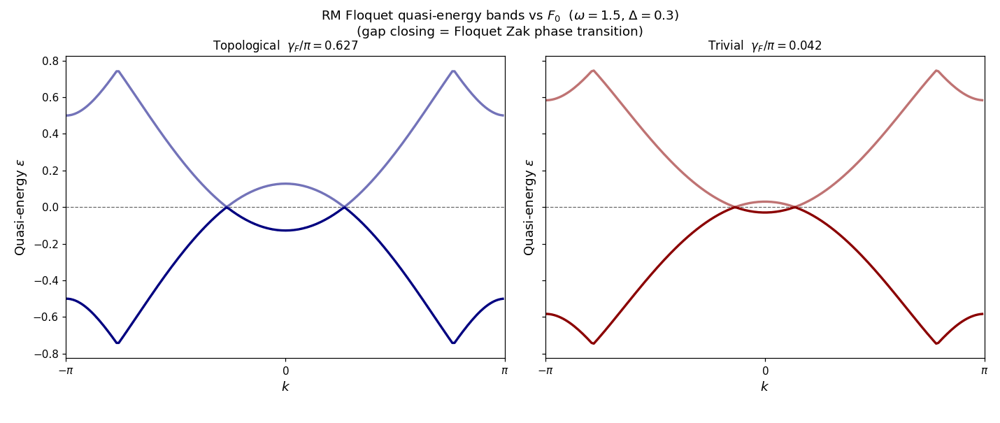

In [20]:
# ── GIF: quasi-energy bands vs F0 (k-space) with Floquet Zak phase ──────
n_frames_gif = 60
F0_gif       = np.linspace(0.0, 2.5, n_frames_gif)
k_gif        = np.linspace(-np.pi, np.pi, 200, endpoint=False)
qe_lim_gif   = np.pi / T_laser * 1.1

print("Pre-computing RM Floquet band snapshots ...")
bands_topo_gif = [floquet_bands_RM_2x2(t1_topo, t2_topo, Fv, Delta, k_gif) for Fv in F0_gif]
bands_triv_gif = [floquet_bands_RM_2x2(t1_triv, t2_triv, Fv, Delta, k_gif) for Fv in F0_gif]

# Pre‑compute Floquet Zak phase γF/π for each F0
print("Computing Floquet Zak phase ...")
gam_topo_gif = [floquet_zak_phase_RM(t1_topo, t2_topo, Fv, Delta, Nk=150, n_steps=100) / np.pi for Fv in F0_gif]
gam_triv_gif = [floquet_zak_phase_RM(t1_triv, t2_triv, Fv, Delta, Nk=150, n_steps=100) / np.pi for Fv in F0_gif]
print("Done.")

fig_gif, axes_gif = plt.subplots(1, 2, figsize=(13, 5.5), sharey=True)
ax_t_gif, ax_v_gif = axes_gif

for ax in axes_gif:
    ax.axhline(0,      color='black', lw=0.8, ls='--', alpha=0.6, zorder=1)
    ax.axhline( qe_lim_gif, color='gray', lw=0.5, ls=':', alpha=0.5)
    ax.axhline(-qe_lim_gif, color='gray', lw=0.5, ls=':', alpha=0.5)
    ax.set_xlim(-np.pi, np.pi)
    ax.set_ylim(-qe_lim_gif, qe_lim_gif)
    ax.set_xticks([-np.pi, 0, np.pi])
    ax.set_xticklabels([r'$-\pi$', '$0$', r'$\pi$'])
    ax.set_xlabel(r'$k$', fontsize=12)
    ax.set_ylabel(r'Quasi-energy $\varepsilon$', fontsize=12)

line_gt0, = ax_t_gif.plot([], [], color='navy',    lw=2.2)
line_gt1, = ax_t_gif.plot([], [], color='navy',    lw=2.2, alpha=0.55)
line_gv0, = ax_v_gif.plot([], [], color='darkred', lw=2.2)
line_gv1, = ax_v_gif.plot([], [], color='darkred', lw=2.2, alpha=0.55)

ttl_t = ax_t_gif.text(0.03, 0.95, '', transform=ax_t_gif.transAxes, fontsize=10,
                        va='top', bbox=dict(boxstyle='round', fc='white', alpha=0.8))
ttl_v = ax_v_gif.text(0.03, 0.95, '', transform=ax_v_gif.transAxes, fontsize=10,
                        va='top', bbox=dict(boxstyle='round', fc='white', alpha=0.8))
ttl_F = fig_gif.text(0.5, 0.01, '', ha='center', fontsize=12, color='black')

fig_gif.suptitle(fr'RM Floquet quasi-energy bands vs $F_0$  ($\omega={omega}$, $\Delta={Delta}$)'
                 '\n(gap closing = Floquet Zak phase transition)',
                 fontsize=12)
plt.tight_layout(rect=[0, 0.04, 1, 1])

def update_gif(frame):
    bt = bands_topo_gif[frame]
    bv = bands_triv_gif[frame]
    F0_v = F0_gif[frame]
    gam_t = gam_topo_gif[frame]
    gam_v = gam_triv_gif[frame]

    line_gt0.set_data(k_gif, bt[:, 0])
    line_gt1.set_data(k_gif, bt[:, 1])
    line_gv0.set_data(k_gif, bv[:, 0])
    line_gv1.set_data(k_gif, bv[:, 1])

    # Colour bands based on gap openness (as before)
    gap_t = np.min(np.abs(bt[:, 1] - bt[:, 0]))
    gap_v = np.min(np.abs(bv[:, 1] - bv[:, 0]))
    col_t = 'navy' if gap_t > 1e-4 else 'gray'
    col_v = 'darkred' if gap_v > 1e-4 else 'gray'
    line_gt0.set_color(col_t); line_gt1.set_color(col_t)
    line_gv0.set_color(col_v); line_gv1.set_color(col_v)

    # Display γF/π instead of the gap
    ax_t_gif.set_title(f'Topological  $\\gamma_F/\\pi = {gam_t:.3f}$', fontsize=11)
    ax_v_gif.set_title(f'Trivial  $\\gamma_F/\\pi = {gam_v:.3f}$', fontsize=11)

    ttl_F.set_text(fr'$F_0 = {F0_v:.3f}$')
    return (line_gt0, line_gt1, line_gv0, line_gv1, ttl_t, ttl_v, ttl_F)

anim_gif = animation.FuncAnimation(fig_gif, update_gif, frames=n_frames_gif,
                                    interval=80, blit=True)
anim_gif.save('RM_floquet_gap_tracking.gif', writer=PillowWriter(fps=14), dpi=110)
plt.close(fig_gif)
print("Saved → RM_floquet_gap_tracking.gif")
Image('RM_floquet_gap_tracking.gif')

# 11. HHG Analysis: Time Evolution

Evolving RM topological phase ...
  step 0/3200  (0%)
  step 640/3200  (20%)
  step 1280/3200  (40%)
  step 1920/3200  (60%)
  step 2560/3200  (80%)

Evolving RM trivial phase ...
  step 0/3200  (0%)
  step 640/3200  (20%)
  step 1280/3200  (40%)
  step 1920/3200  (60%)
  step 2560/3200  (80%)

Peak current — topo:  82.5246
Peak current — triv:  27.0578


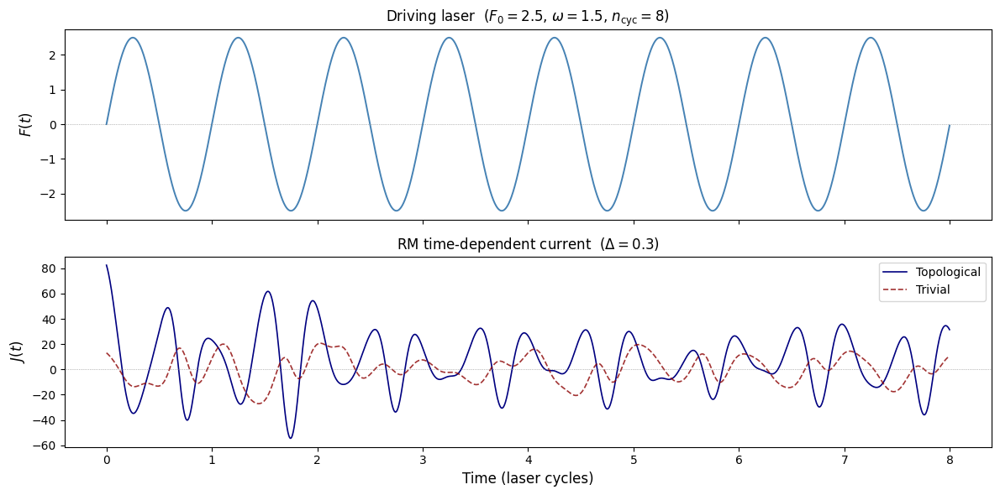

In [21]:
def compute_hhg(current):
    """Hann-windowed FFT → HHG power spectrum. Returns (harm_order, power)."""
    win   = np.hanning(len(current))
    Nfft  = 4 * len(current)
    J_fft = np.fft.rfft(current * win, n=Nfft)
    freqs = np.fft.rfftfreq(Nfft, d=dt)
    S     = np.abs(J_fft)**2
    harm  = freqs / (omega / (2*np.pi))
    return harm, S

def build_rho0_RM(t1, t2, Delta_val):
    """Ground-state density matrix at half filling for RM."""
    _, evecs = np.linalg.eigh(build_H_RM(t1, t2, 0.0, Delta_val))
    psi0 = evecs[:, :M//2]
    return psi0 @ psi0.conj().T

def rhs_coherent_RM(rho, A_val, t1, t2, Delta_val):
    H_t = build_H_RM(t1, t2, A_val, Delta_val)
    return -1j * (H_t @ rho - rho @ H_t)

def time_evolve_RM(t1, t2, Delta_val, A_drive=None, verbose=True):
    """RK4 coherent density-matrix propagation for RM; returns J(t)."""
    if A_drive is None:
        A_drive = A_arr
    rho     = build_rho0_RM(t1, t2, Delta_val)
    current = np.zeros(len(A_drive))
    for step in range(len(A_drive)):
        A_val = A_drive[step]
        current[step] = 2.0 * np.real(np.trace(build_J_RM(t1, t2, A_val) @ rho))
        if step < len(A_drive) - 1:
            A_next = A_drive[step + 1]
            A_mid  = 0.5*(A_val + A_next)
            k1 = rhs_coherent_RM(rho,             A_val,  t1, t2, Delta_val)
            k2 = rhs_coherent_RM(rho + .5*dt*k1,  A_mid,  t1, t2, Delta_val)
            k3 = rhs_coherent_RM(rho + .5*dt*k2,  A_mid,  t1, t2, Delta_val)
            k4 = rhs_coherent_RM(rho +    dt*k3,  A_next, t1, t2, Delta_val)
            rho = rho + (dt/6.0)*(k1 + 2*k2 + 2*k3 + k4)
        if verbose and step % (Nt//5) == 0:
            print(f"  step {step}/{Nt}  ({100*step/Nt:.0f}%)")
    return current

# ── Evolve and compute HHG ─────────────────────────────────────────────────
print("Evolving RM topological phase ...")
J_topo_RM = time_evolve_RM(t1_topo, t2_topo, Delta)

print("\nEvolving RM trivial phase ...")
J_triv_RM = time_evolve_RM(t1_triv, t2_triv, Delta)

harm_topo_RM, S_topo_RM = compute_hhg(J_topo_RM)
harm_triv_RM, S_triv_RM = compute_hhg(J_triv_RM)

print(f"\nPeak current — topo:  {np.max(np.abs(J_topo_RM)):.4f}")
print(f"Peak current — triv:  {np.max(np.abs(J_triv_RM)):.4f}")

# ── Current time series ────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
axes[0].plot(t_arr/T_per, F_arr, color='steelblue', lw=1.4)
axes[0].set_ylabel(r'$F(t)$', fontsize=12)
axes[0].set_title(fr'Driving laser  ($F_0={F0}$, $\omega={omega}$, $n_\mathrm{{cyc}}={n_cyc}$)',
                  fontsize=12)
axes[1].plot(t_arr/T_per, J_topo_RM, color='navy',    lw=1.2, label='Topological')
axes[1].plot(t_arr/T_per, J_triv_RM, color='darkred', lw=1.2, ls='--', label='Trivial', alpha=0.8)
axes[1].set_xlabel('Time (laser cycles)', fontsize=12)
axes[1].set_ylabel(r'$J(t)$', fontsize=12)
axes[1].set_title(fr'RM time-dependent current  ($\Delta={Delta}$)', fontsize=12)
axes[1].legend(fontsize=10)
for ax in axes: ax.axhline(0, color='gray', lw=0.5, ls=':')
plt.tight_layout()
plt.savefig('RM_HHG_current.png', dpi=150, bbox_inches='tight')
plt.show()

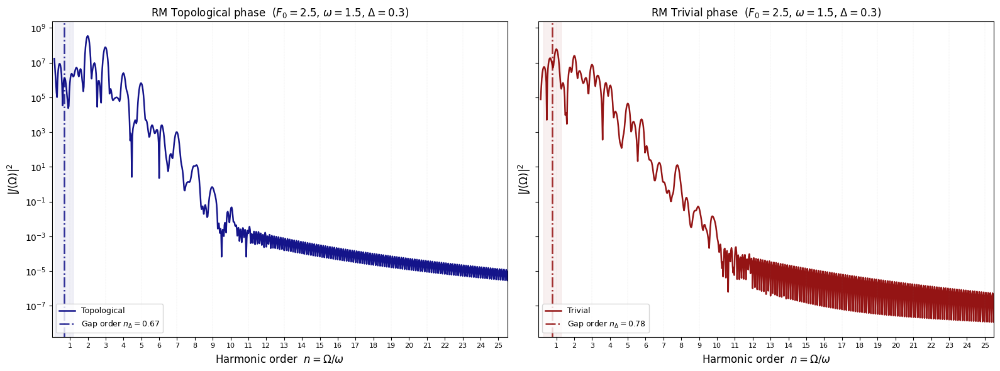

Saved RM_HHG_spectra.png (topological and trivial side by side)


In [22]:
# ── HHG power spectrum (side by side) ─────────────────────────────────────
gap_topo_RM = 2*np.sqrt((t1_topo-t2_topo)**2 + Delta**2)
gap_triv_RM = 2*np.sqrt((t1_triv-t2_triv)**2 + Delta**2)
n_gap_topo_RM = gap_topo_RM / omega
n_gap_triv_RM = gap_triv_RM / omega

fig, (ax_h_t, ax_h_v) = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# ---- Topological ----
mask = (harm_topo_RM > 0.1) & (harm_topo_RM < 26)
ax_h_t.semilogy(harm_topo_RM[mask], S_topo_RM[mask], color='navy', lw=1.8, label='Topological', alpha=0.92)
for n in range(1, 26, 2):
    ax_h_t.axvline(n, color='gray', lw=0.35, alpha=0.35, ls=':')
ax_h_t.axvline(n_gap_topo_RM, color='navy', lw=1.8, ls='-.', alpha=0.8,
               label=fr'Gap order $n_\Delta = {n_gap_topo_RM:.2f}$')
ax_h_t.axvspan(n_gap_topo_RM - 0.5, n_gap_topo_RM + 0.5, alpha=0.06, color='navy')
ax_h_t.set_ylabel(r'$|J(\Omega)|^2$', fontsize=12)
ax_h_t.set_title(f'RM Topological phase  ($F_0={F0}$, $\\omega={omega}$, $\\Delta={Delta}$)', fontsize=12)
ax_h_t.legend(fontsize=9, loc='lower left')
ax_h_t.set_xlim(0, 25.5)
ax_h_t.set_xticks(range(1, 26))
ax_h_t.set_xticklabels([str(n) for n in range(1, 26)], fontsize=8)
ax_h_t.set_xlabel(r'Harmonic order  $n = \Omega/\omega$', fontsize=12)

# ---- Trivial ----
mask_v = (harm_triv_RM > 0.1) & (harm_triv_RM < 26)
ax_h_v.semilogy(harm_triv_RM[mask_v], S_triv_RM[mask_v], color='darkred', lw=1.8, label='Trivial', alpha=0.92)
for n in range(1, 26, 2):
    ax_h_v.axvline(n, color='gray', lw=0.35, alpha=0.35, ls=':')
ax_h_v.axvline(n_gap_triv_RM, color='darkred', lw=1.8, ls='-.', alpha=0.8,
               label=fr'Gap order $n_\Delta = {n_gap_triv_RM:.2f}$')
ax_h_v.axvspan(n_gap_triv_RM - 0.5, n_gap_triv_RM + 0.5, alpha=0.06, color='darkred')
ax_h_v.set_ylabel(r'$|J(\Omega)|^2$', fontsize=12)   # kept for clarity
ax_h_v.set_title(f'RM Trivial phase  ($F_0={F0}$, $\\omega={omega}$, $\\Delta={Delta}$)', fontsize=12)
ax_h_v.legend(fontsize=9, loc='lower left')
ax_h_v.set_xlim(0, 25.5)
ax_h_v.set_xticks(range(1, 26))
ax_h_v.set_xticklabels([str(n) for n in range(1, 26)], fontsize=8)
ax_h_v.set_xlabel(r'Harmonic order  $n = \Omega/\omega$', fontsize=12)

plt.tight_layout()
plt.savefig('RM_HHG_spectra.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved RM_HHG_spectra.png (topological and trivial side by side)")

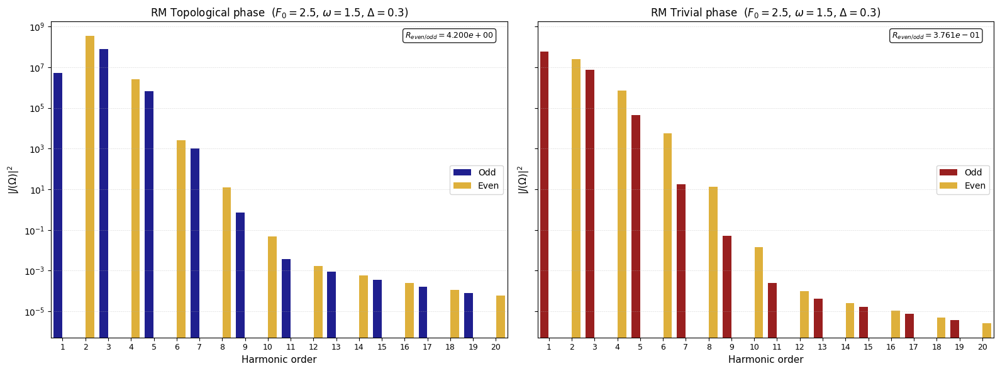

Saved RM_odd_even_spectra.png (topological and trivial side by side)


In [23]:
# ── Odd/Even harmonic decomposition (side by side) ────────────────────────
def harmonic_intensities(harm, spectrum, n_max=20):
    orders = np.arange(1, n_max + 1)
    intens = np.zeros(n_max)
    for idx, n in enumerate(orders):
        win = (harm >= n - 0.4) & (harm <= n + 0.4)
        intens[idx] = np.max(spectrum[win]) if win.any() else 1e-50
    return orders, intens

ns_t, Is_t = harmonic_intensities(harm_topo_RM, S_topo_RM)
ns_v, Is_v = harmonic_intensities(harm_triv_RM, S_triv_RM)

odd_mask  = (ns_t % 2 == 1)
even_mask = (ns_t % 2 == 0)

fig, (ax_oe_t, ax_oe_v) = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# ---- Topological ----
ax_oe_t.bar(ns_t[odd_mask]  - 0.2, Is_t[odd_mask],
            width=0.38, color='navy',        alpha=0.88, label='Odd')
ax_oe_t.bar(ns_t[even_mask] + 0.2, Is_t[even_mask],
            width=0.38, color='goldenrod',   alpha=0.88, label='Even')
ax_oe_t.set_yscale('log')
ax_oe_t.set_xticks(np.arange(1, 21))
ax_oe_t.set_xticklabels([str(n) for n in range(1, 21)], fontsize=9)
ax_oe_t.set_xlim(0.5, 20.5)
ax_oe_t.set_xlabel('Harmonic order', fontsize=11)
ax_oe_t.set_ylabel(r'$|J(\Omega)|^2$', fontsize=11)
ax_oe_t.set_title(f'RM Topological phase  ($F_0={F0}$, $\\omega={omega}$, $\\Delta={Delta}$)', fontsize=12)
ax_oe_t.legend(fontsize=10)
ax_oe_t.grid(True, ls=':', lw=0.4, axis='y')
ratio_t = np.sum(Is_t[even_mask]) / (np.sum(Is_t[odd_mask]) + 1e-60)
ax_oe_t.text(0.97, 0.97, fr'$R_{{even/odd}} = {ratio_t:.3e}$',
             transform=ax_oe_t.transAxes, fontsize=9, ha='right', va='top',
             bbox=dict(boxstyle='round', fc='white', alpha=0.85))

# ---- Trivial ----
ax_oe_v.bar(ns_v[odd_mask]  - 0.2, Is_v[odd_mask],
            width=0.38, color='darkred',     alpha=0.88, label='Odd')
ax_oe_v.bar(ns_v[even_mask] + 0.2, Is_v[even_mask],
            width=0.38, color='goldenrod',   alpha=0.88, label='Even')
ax_oe_v.set_yscale('log')
ax_oe_v.set_xticks(np.arange(1, 21))
ax_oe_v.set_xticklabels([str(n) for n in range(1, 21)], fontsize=9)
ax_oe_v.set_xlim(0.5, 20.5)
ax_oe_v.set_xlabel('Harmonic order', fontsize=11)
ax_oe_v.set_ylabel(r'$|J(\Omega)|^2$', fontsize=11)   # kept for clarity (shared y)
ax_oe_v.set_title(f'RM Trivial phase  ($F_0={F0}$, $\\omega={omega}$, $\\Delta={Delta}$)', fontsize=12)
ax_oe_v.legend(fontsize=10)
ax_oe_v.grid(True, ls=':', lw=0.4, axis='y')
ratio_v = np.sum(Is_v[even_mask]) / (np.sum(Is_v[odd_mask]) + 1e-60)
ax_oe_v.text(0.97, 0.97, fr'$R_{{even/odd}} = {ratio_v:.3e}$',
             transform=ax_oe_v.transAxes, fontsize=9, ha='right', va='top',
             bbox=dict(boxstyle='round', fc='white', alpha=0.85))

plt.tight_layout()
plt.savefig('RM_odd_even_spectra.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved RM_odd_even_spectra.png (topological and trivial side by side)")

Scanning 16 F0 values for RM HHG maps ...
  F0 = 0.20  done
  F0 = 0.35  done
  F0 = 0.51  done
  F0 = 0.66  done
  F0 = 0.81  done
  F0 = 0.97  done
  F0 = 1.12  done
  F0 = 1.27  done
  F0 = 1.43  done
  F0 = 1.58  done
  F0 = 1.73  done
  F0 = 1.89  done
  F0 = 2.04  done
  F0 = 2.19  done
  F0 = 2.35  done
  F0 = 2.50  done


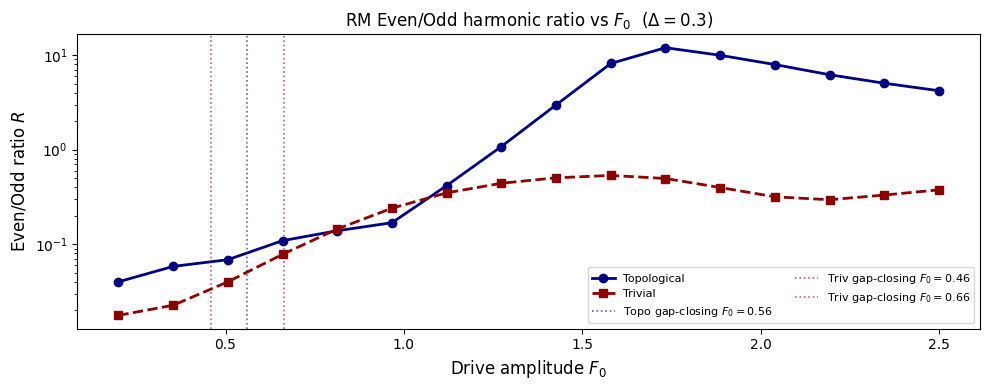

In [24]:
# ── Even/odd ratio vs F0 ───────────────────────────────────────────────────
F0_hhg_scan = np.linspace(0.2, 2.5, 16)
ratio_topo_RM = []
ratio_triv_RM = []
print(f"Scanning {len(F0_hhg_scan)} F0 values for RM HHG maps ...")
for F0_val in F0_hhg_scan:
    A_temp = -(F0_val/omega)*np.cos(omega*t_arr)
    Jt = time_evolve_RM(t1_topo, t2_topo, Delta, A_drive=A_temp, verbose=False)
    Jv = time_evolve_RM(t1_triv, t2_triv, Delta, A_drive=A_temp, verbose=False)
    ht, St = compute_hhg(Jt)
    hv, Sv = compute_hhg(Jv)
    _, It = harmonic_intensities(ht, St)
    _, Iv = harmonic_intensities(hv, Sv)
    ratio_topo_RM.append(np.sum(It[even_mask]) / (np.sum(It[odd_mask]) + 1e-60))
    ratio_triv_RM.append(np.sum(Iv[even_mask]) / (np.sum(Iv[odd_mask]) + 1e-60))
    print(f"  F0 = {F0_val:.2f}  done")

fig, ax = plt.subplots(figsize=(10, 4))
ax.semilogy(F0_hhg_scan, ratio_topo_RM, 'o-', color='navy',    lw=2, ms=6,
            label='Topological')
ax.semilogy(F0_hhg_scan, ratio_triv_RM, 's--', color='darkred', lw=2, ms=6,
            label='Trivial')
# Mark gap-closing F0 from earlier (if available)
for F0_tr in trans_topo:
    ax.axvline(F0_tr, color='navy',    lw=1.2, ls=':', alpha=0.6,
               label=fr'Topo gap-closing $F_0={F0_tr:.2f}$')
for F0_tr in trans_triv:
    ax.axvline(F0_tr, color='darkred', lw=1.2, ls=':', alpha=0.6,
               label=fr'Triv gap-closing $F_0={F0_tr:.2f}$')
ax.set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
ax.set_ylabel(r'Even/Odd ratio $R$', fontsize=12)
ax.set_title(fr'RM Even/Odd harmonic ratio vs $F_0$  ($\Delta={Delta}$)', fontsize=12)
ax.legend(fontsize=8, ncol=2)
plt.tight_layout()
plt.savefig('RM_even_odd_ratio.png', dpi=150, bbox_inches='tight')
plt.show()